## Chapter 11: Principles of Feature Learning

# 11.1 Universal approximators

In Chapter 10 we saw how supervised and unsupervised learners alike can be extended to perform nonlinear learning via the use of arbitrary linear combination of nonlinear functions / feature transformations that we engineered ourselves.  There we expressed 
a general nonlinear model as a weighted sum of $B$ nonlinear functions of our input as

\begin{equation}
\text{model}\left(\mathbf{x},\Omega\right) = w_0 + f_1\left(\mathbf{x}\right){w}_{1} +  f_2\left(\mathbf{x}\right){w}_{2} + \cdots + f_B\left(\mathbf{x}\right)w_B
\end{equation}

where $f_1,\,f_2,\,...\,f_B$ are nonlinear parameterized or unparameterized functions / features - or *feature transformations* - and $w_0$ through $w_B$ (along with any additional weights internal to the nonlinear functions) are represented in the weight set $\Omega$.  This generic nonlinear model was used both with nonlinear regression and classification, as well as a model for the encoder / decoder pair of the nonlinear Autoencoder.   

In the examples of Chapter 10 we *engineered* appropriate nonlinear functions / features $f_1,\,...,f_B$ ourselves to match the patterns we gleamed in simple datasets.  In this Section we will instead choose these nonlinearities from collections known as *universal approximators*.   Universal approximators are collections or families of simple nonlinear functions / feature transformations whose members can be combined to create artbitrarily complex nonlinearities.  Simple exemplars from the three most popular universal approximators - called *kernels*, *neural networks*, and *trees* respectively - are also introduced.  Here we will see that in the *ideal scenario* where we have *inifinitely many datapoints and infinite computation* how we may employ any one of these collections to *perfectly represent any nonlinearity*.

In [ ]:
## This code cell will not be shown in the HTML version of this notebook
# imports from custom library
import sys
sys.path.append('../../')
import autograd.numpy as np
from mlrefined_libraries import nonlinear_superlearn_library as nonlib
datapath = '../../mlrefined_datasets/nonlinear_superlearn_datasets/'

# plotting tools
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

## 11.1.1  Universal approximation - the big picture

Every physical object in the world around us can be decomposed into fundamental parts, called atomic *elements*, which are typically collected and presented in the [periodic table](https://en.wikipedia.org/wiki/Periodic_table).  A molecule of water - for example - consists of two parts hydrogen and one part oxygen (hence its chemical acronym $H_20$).  Even an extremely complex objects like an automobile - when viewed from the perspective of its atomic elements - can be thought of as a simple combination of elements.  Conversely then, if we can combine these atomic elements in just the right way we can likewise *create any physical object* (which is no simple matter for a physical object like an automobile) .

In analogy to physical objects, mathematical objects (that is, mathematical functions) can be similarly broken down into combinations of fundamental parts.  These 'atomic elements' are simple mathematical and/or programatic elements that are organized into various 'periodic tables' - unlike the case of physical objects with mathematical ones we have *many different 'periodic tables' to choose from*.  Each one of these 'periodic tables' is called a *universal approximator* in the jargon of machine learning, and using any one of them we can decompose / build any mathematical function we wish. 





into combinations of simpler mathematical functions.  Stated more formally, any (piecewise) continuous mathematical function $h\left(\mathbf{x}\right)$ can be broken down into / approximated by a linear combination of $B$ 'simple' functions $f_1,\,f_2,\,...\,f_B$ in general as
 
\begin{equation}
h\left(\mathbf{x}\right) =  w_0 + f_1\left(\mathbf{x}\right){w}_{1} +  f_2\left(\mathbf{x}\right){w}_{2} + \cdots + f_B\left(\mathbf{x}\right)w_B
\end{equation}

where each of the simpler nonlinear functions on the right hand side can have internal parameters.  This is actually a rather old mathematical fact (e.g., with roots in the 1700s) which we call *universal approximation* in the machine learning / deep learning world.  



> With enough universal approximators, with correctly tuned parameters, we can approximate any piecewise continuous mathematical function $h\left(\mathbf{x}\right)$ as closely as we wish as $h\left(\mathbf{x}\right) =  w_0 + f_1\left(\mathbf{x}\right){w}_{1} +  f_2\left(\mathbf{x}\right){w}_{2} + \cdots + f_B\left(\mathbf{x}\right)w_B$

For example, below we show a continuous nonlinear function $h$ in black, and approximate this function using $B = 300$ universal approximators.  As you move the slider from left to right you will see a red curve jump onto the screen - this is the combination of our $300$ universal approximators shown first with a poor choice of parameter settings.  As yo move the slider from left to right we illustrate how the shape of this combination improves (in terms of how it approximates $h$) as we improve its parameters.  Eventually - moving the slider all the way to the right where we show an especially good setting of these parameters -  the combination approximates $h$ quite well (and indeed if we kept refining its parameters it could perfectly represent $h$).


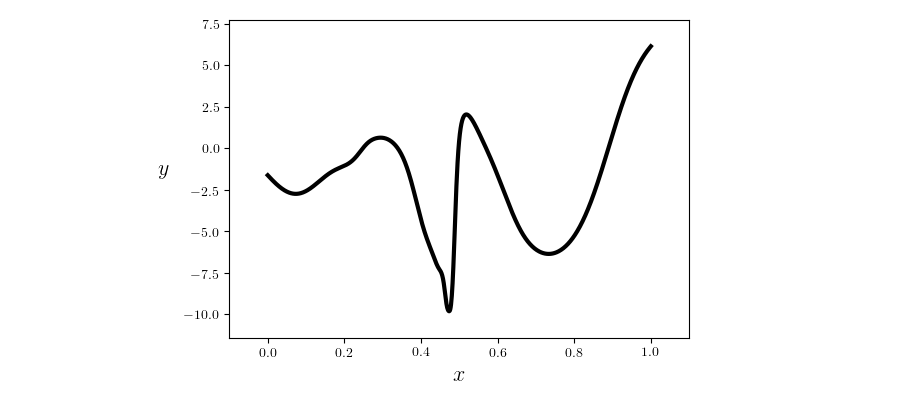
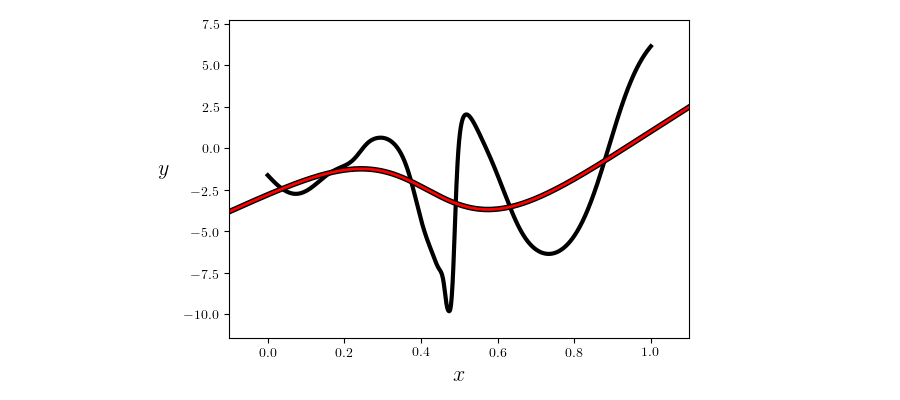
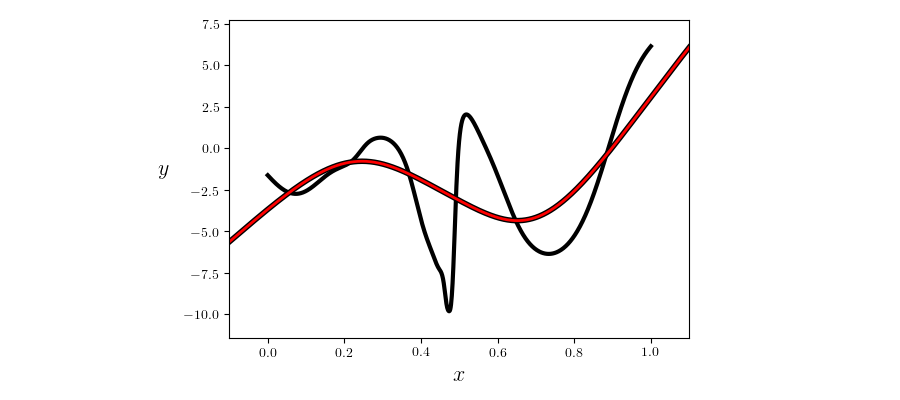
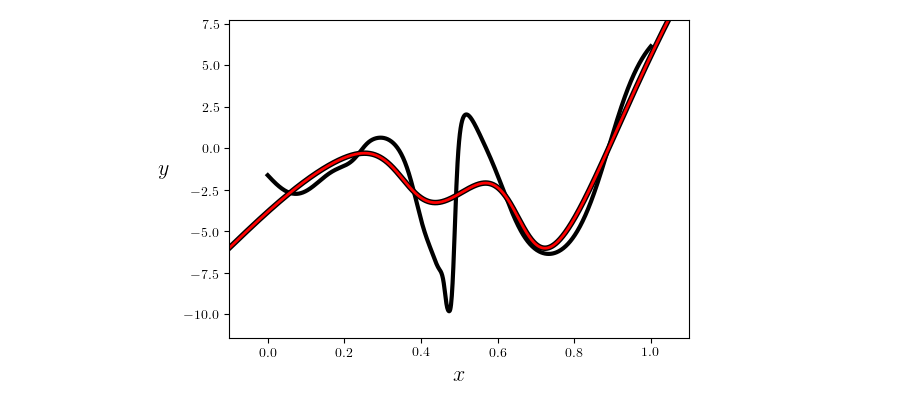
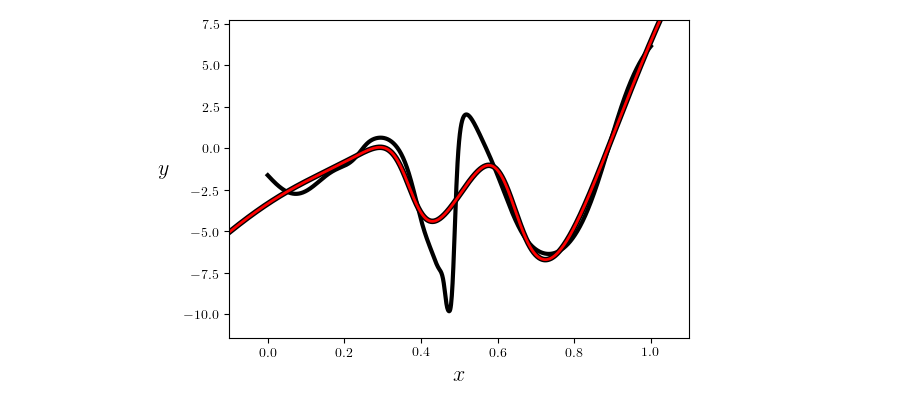
...
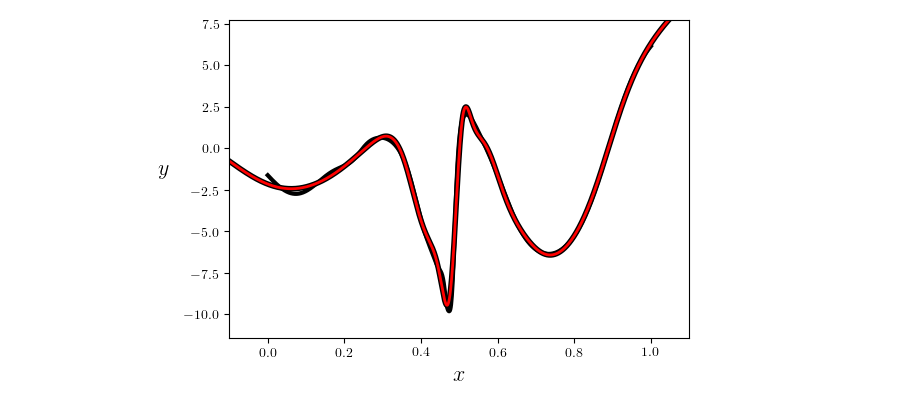
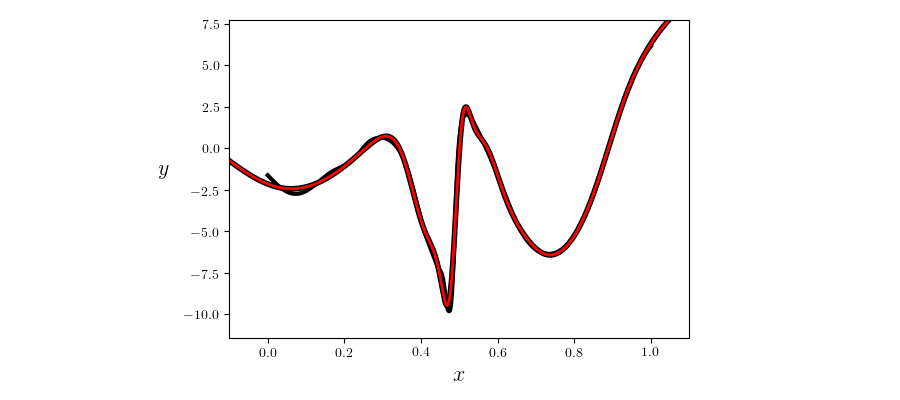
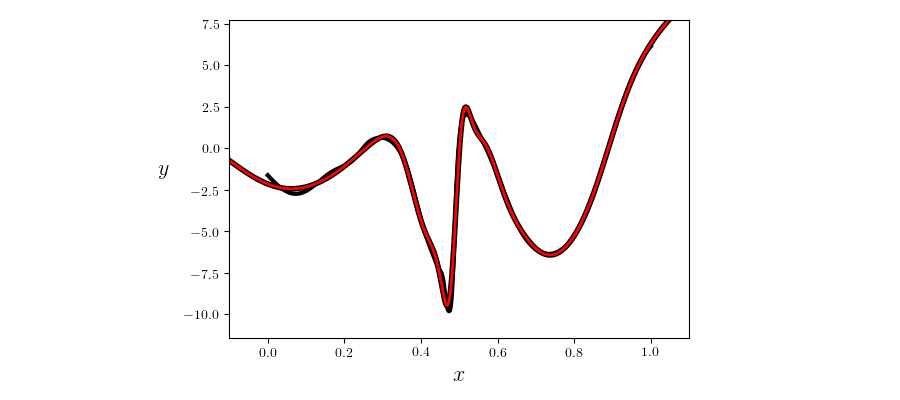
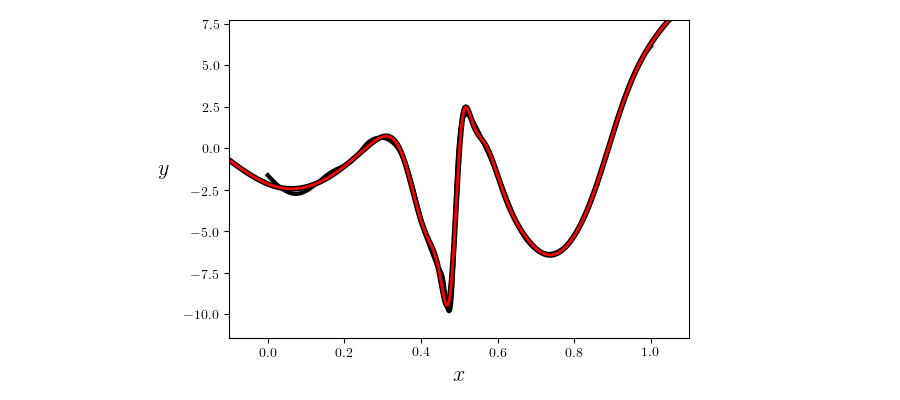
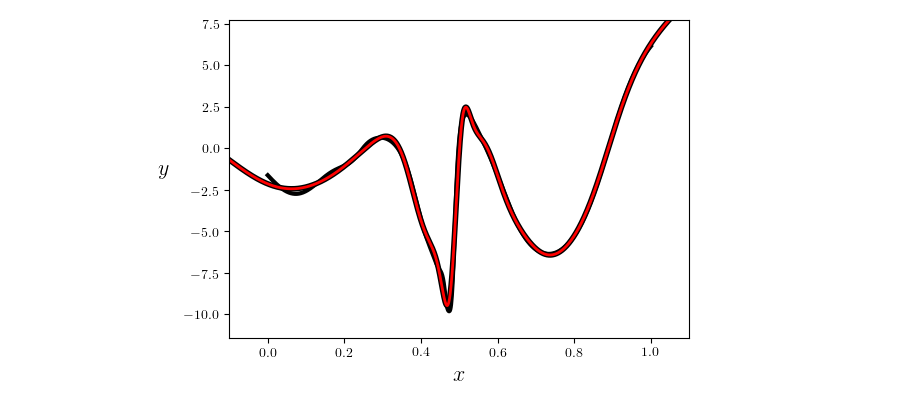

In [97]:
## This code cell will not be shown in the HTML version of this notebook
# load in dataset
csvname = datapath + 'universal_regression_function.csv'
data = np.loadtxt(csvname,delimiter = ',')
x = data[:-1,:]
y = data[-1:,:] 

# import the v1 library
mylib1 = nonlib.library_v1.superlearn_setup.Setup(x,y)

# choose features
mylib1.choose_features(name = 'multilayer_perceptron',layer_sizes = [1,300,1],activation = 'tanh')

# choose normalizer
mylib1.choose_normalizer(name = 'standard')

# choose cost
mylib1.choose_cost(name = 'least_squares')

# fit an optimization
mylib1.fit(max_its = 30000,alpha_choice = 3*10**(-2))

# load up animator
demo1 = nonlib.run_animators.Visualizer(csvname)

# pluck out a sample of the weight history
num_frames = 100 # how many evenly spaced weights from the history to animate

# animate based on the sample weight history
demo1.animate_1d_regression(mylib1,num_frames,scatter = 'none',show_history = False)

Even functions with discrete jumps - like a step function - can be approximated infinitely closely using a combination of universal approximators.  Below we show a similar animation to the one above, only there we approximate a step function with nonlinear jumps.  Here we use $B=100$ universal approximators, and once again as you move the slider from left to right the parameters of the combination are improved so that the approximation looks more and more like the function $h$ itself.  


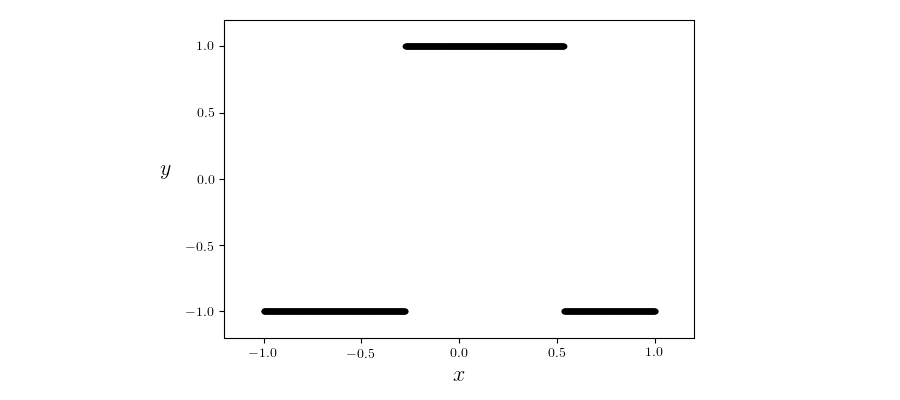
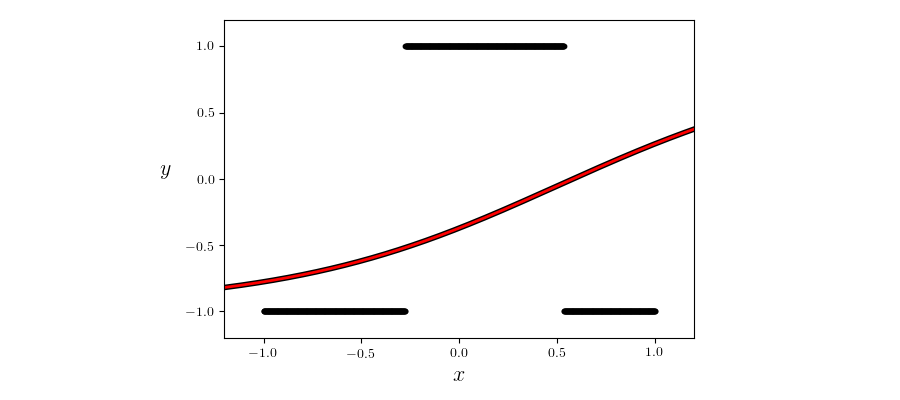
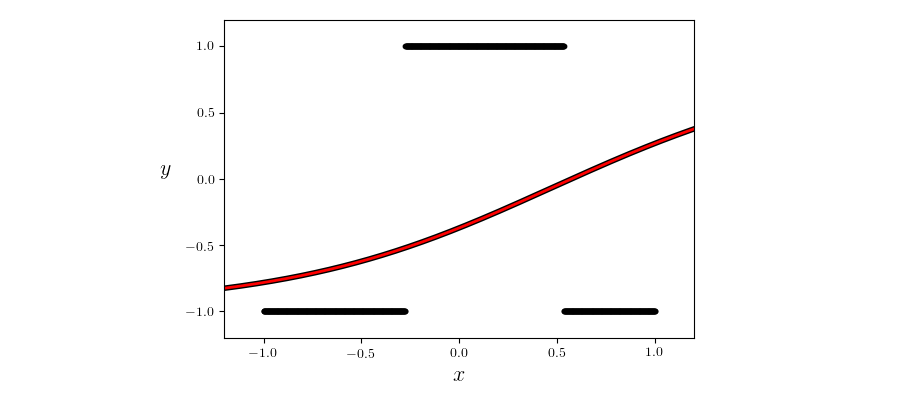
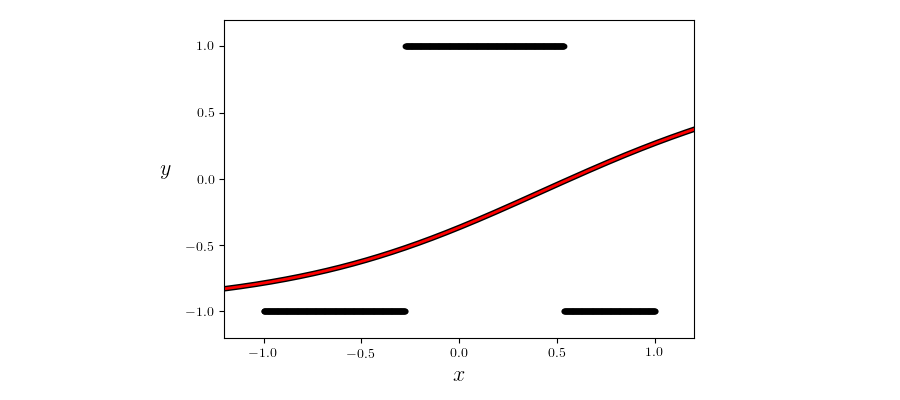
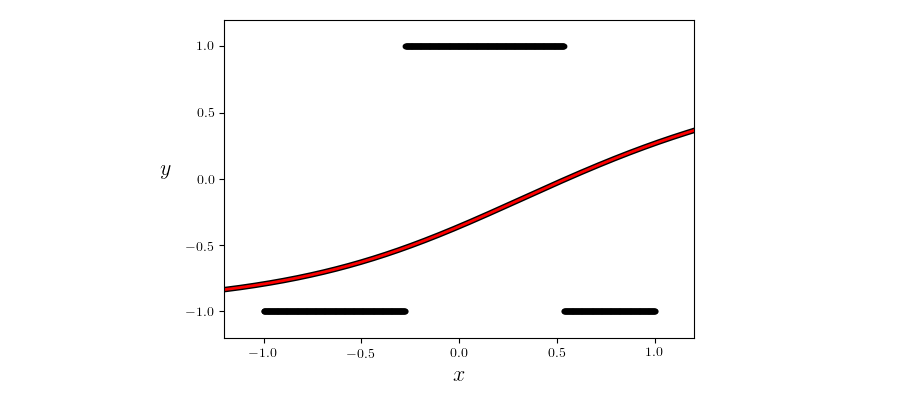
...
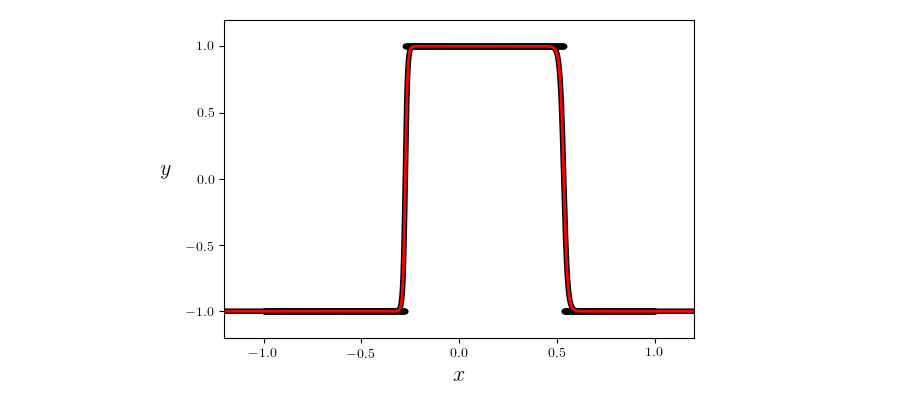
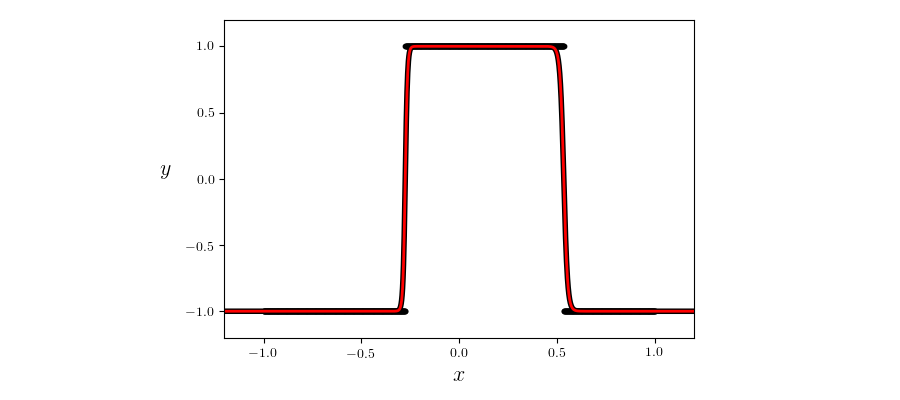
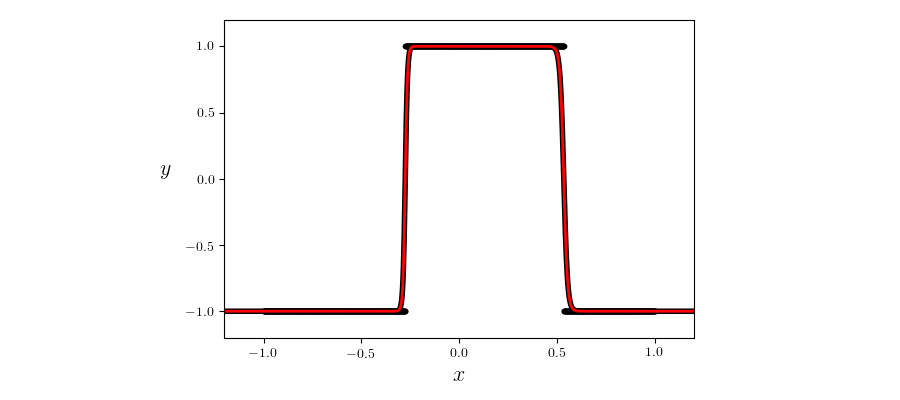
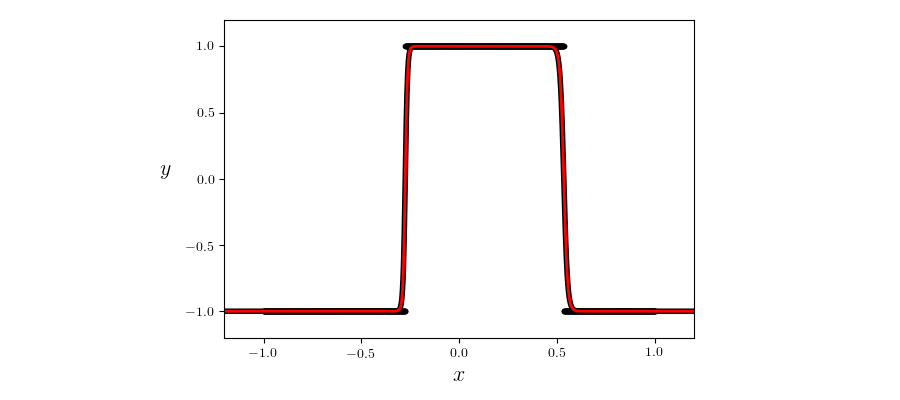
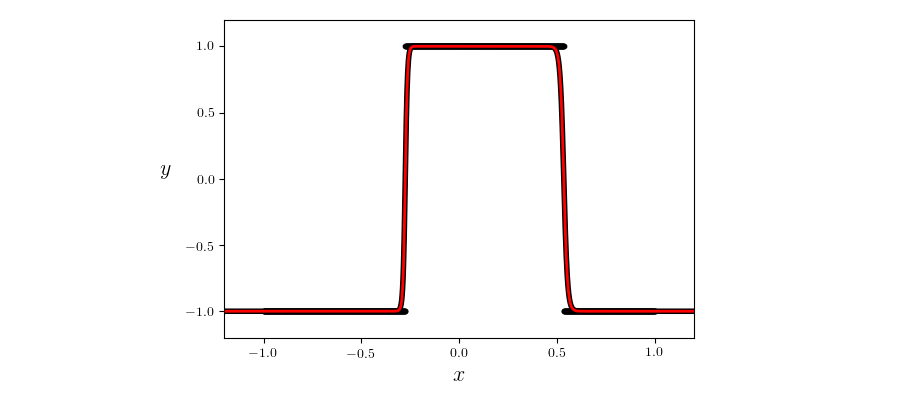

In [99]:
## This code cell will not be shown in the HTML version of this notebook
# load in data
csvname = datapath + 'discrete_function.csv'
data = np.loadtxt(csvname,delimiter = ',')
x = data[:-1,:]
y = data[-1:,:] 

# import the v1 library
mylib2 = nonlib.library_v1.superlearn_setup.Setup(x,y)

# choose features
mylib2.choose_features(name = 'multilayer_perceptron',layer_sizes = [1,100,1],activation = 'tanh')

# choose normalizer
mylib2.choose_normalizer(name = 'standard')

# choose cost
mylib2.choose_cost(name = 'softmax')

# fit an optimization
mylib2.fit(max_its = 10000,alpha_choice = 10**(-1))

# load up animator
demo2 = nonlib.run_animators.Visualizer(csvname)

# pluck out a sample of the weight history
num_frames = 100 # how many evenly spaced weights from the history to animate

# animate based on the sample weight history
demo2.animate_1d_regression(mylib2,num_frames,scatter = 'function',show_history = False)

What are these 'simple' universal approximators $f_1,\,f_2,\,...\,f_B$?  How do we set the parameters of this linear combination correctly (including possible internal parameters of the the functions $f_1,\,f_2,\,...\,f_B$)?  What does this have to do with determining a proper nonlinearity for a supervised/unsupervised dataset?  We address each of these questions below.

## 11.1.2  Universal approximators

There is an enormous variety of 'simple' functions  $f_1,\,f_2,\,...\,f_B$ that fall into the category of *universal approximators*.  Typically these are organized into three families or catalogs of similar functions called *kernels*, *neural networks*, and *trees* respectively.  Roughly speaking, using functions from any one of these families we can perform the kind of universal approximation described above.  That is, using any one of these families we can decompose / approximate any piecewise continuous function as finely as we desire provided we use enough members (i.e., $B$ is large enough) and all parameters are set correctly.  Each of these popular families has its own unique strengths and weaknesses, a wide range of technical details to explore, and conventions of usage.  Here we introduce them at a high level, but dedicate an entire Chapter to each family in Chapters 13 - 15.

### The kernel family of universal approximators

The family of *kernel* functions consists of groups of functions with *no internal parameters*, a popular example being *polynoimals*.  When dealing with just one input this sub-family of kernel functions looks like 

\begin{equation}
f_1(x) = x, ~~ f_2(x) = x^2,~~ f_3(x)=x^3,...
\end{equation}

and so forth with the $D^{th}$ element taking the form $f_D(x) = x^D$.  A combination of the first $D$ units from this sub-family is often referred to as a *degree $D$ polynomial*.  There are an infinite number of these functions - one for each positive whole number - and they are *naturally ordered* by their degree (the higher the degree, the further down the list that function is).  Moreover each element has a *fixed shape* - e.g., the monomial $f_2(x) = x^2$ is always a parabola, and looks like a cup facing upwards.  Below we plot the first four elements (also called *units*) of the polynomial sub-family of kernel functions.

<IPython.core.display.Javascript object>


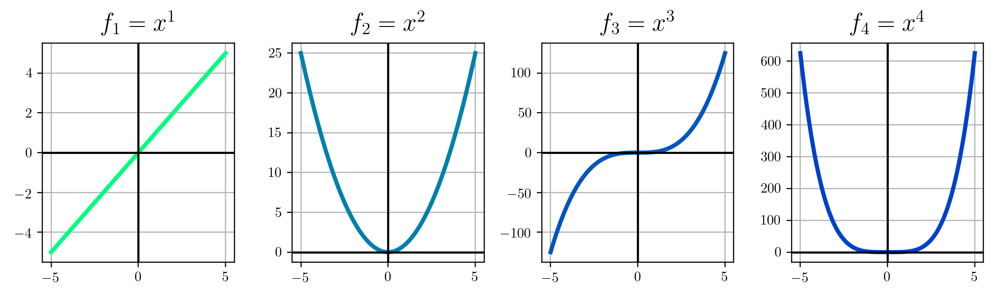

In [93]:
## This code cell will not be shown in the HTML version of this notebook
# build the first 4 non-constant polynomial basis elements
x = np.linspace(-5,5,100)
fig = plt.figure(figsize = (10,3))

for m in range(1,5):
    # make basis element
    fm = x**m
    fm_table = np.stack((x,fm),axis = 1)
    
    # plot the current element
    ax = fig.add_subplot(1,4,m)
    ax.plot(fm_table[:,0],fm_table[:,1],color = [0,1/float(m),m/float(m+1)],linewidth = 3)
    ax.set_title('$f_'+str(m) + ' = x^' + str(m) + '$',fontsize = 18)

    # clean up plot
    ax.grid(True, which='both')
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')
plt.show()

In two inputs $x_1$ and $x_2$ polynomial units take the analagous form

\begin{equation}
f_1(x_1,x_2) = x_1, ~~ f_2(x_1,x_2) = x_2^2,  ~~ f(x_1,x_2) = x_1x_2^3, ~~ f(x_1,x_2) = x_1^4x_2^6,...
\end{equation}

with a general degree $D$ unit taking the form 

\begin{equation}
f_m(x_1,x_2) = x_1^px_2^q 
\end{equation}

where where $p$ and $q$ are nonnegative integers and $p + q \leq D$.  A degree $D$ polynomial in this case is a linear combinatino of all such units.  This sort of definition generalizes to defining polynomial units in general $N$ dimensional input as well.  Below we draw a sampling of these polynomial units.

<IPython.core.display.Javascript object>


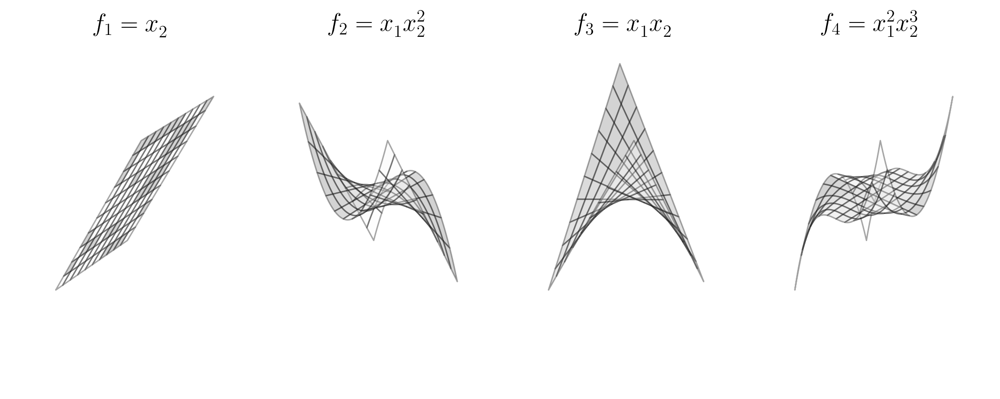

In [19]:
## This code cell will not be shown in the HTML version of this notebook
# generate input values
s = np.linspace(-2,2,100)
x_1,x_2 = np.meshgrid(s,s)
degree_dict = {}

# build 4 polynomial basis elements
fig = plt.figure(num=None, figsize = (10,4), dpi=80, facecolor='w', edgecolor='k')

### plot regression surface ###
p =  [0,1,1,2]
q = [1,2,1,3]
for m in range(4):
    ax1 = plt.subplot(1,4,m+1,projection = '3d')
    ax1.set_axis_off()
    f_m = (x_1**p[m])*(x_2**q[m])
    ax1.plot_surface(x_1,x_2,f_m,alpha = 0.35,color = 'w',zorder = 3,edgecolor = 'k',linewidth=1,cstride = 10, rstride = 10)
    ax1.view_init(20,40)  
    deg1 = ''
    if p[m] == 1:
        deg1 = 'x_1^{\,}'
    if p[m] >=2:
        deg1 = 'x_1^' + str(p[m])
    deg2 = ''
    if q[m] == 1:
        deg2 = 'x_2^{\,}'
    if q[m] >=2:
        deg2 = 'x_2^' + str(q[m])
    ax1.set_title('$f_'+str(m+1) + ' = ' + deg1 + deg2 + '$',fontsize = 18)
fig.subplots_adjust(left=0,right=1,bottom=0,top=1)   # remove whitespace around 3d figure
plt.show()

Another classic sub-family of kernel universal approximators: sine waves of increasing frequency.  This consists of the set of sine waves with frequency increasing by an e.g., integer factor like

$$f_1(x) = \text{sin}(x), ~~ f_2(x) = \text{sin}(2x), ~~ f_3(x) = \text{sin}(3x), ...$$

where the $m^{th}$ element given as $f_m(x) = \text{sin}(mx)$.

Below we plot the table of values for the first four of these catalog functions using their equations.

<IPython.core.display.Javascript object>


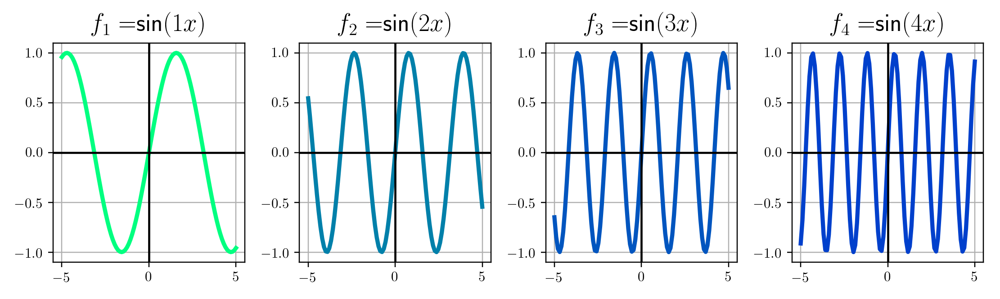

In [91]:
## This code cell will not be shown in the HTML version of this notebook
# build the first 4 non-constant polynomial basis elements
x = np.linspace(-5,5,100)
fig = plt.figure(figsize = (10,3))

for m in range(1,5):
    # make basis element
    fm = np.sin(m*x)
    fm_table = np.stack((x,fm),axis = 1)
    
    # plot the current element
    ax = fig.add_subplot(1,4,m)
    ax.plot(fm_table[:,0],fm_table[:,1],color = [0,1/float(m),m/float(m+1)],linewidth = 3)
    ax.set_title('$f_'+str(m) + ' = '  + '$sin$ ' +  '(' + str(m) + 'x)$',fontsize = 18)

    # clean up plot
    ax.grid(True, which='both')
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')
plt.show()

As with the polynomials, notice how each of these catalog of elements if fixed.  They have no *tunable* parameters inside, the third element always looks like $f_3(x) = \text{sin}(x)$ - that is it always takes on that shape.  Also note, like polynomials to generalize this catalog of functions to higher dimensional input we shove each coordinate through the single dimensional version of the function separately.  So in the case of $N=2$ inputs the functions take the form  

\begin{equation}
f_1(x_1,x_2) = \text{sin}(x1), ~~ f_1(x_1,x_2) =  \text{sin}(2x_1)\text{sin}(5x_2), ~~ f_3(x_1,x_2) = \text{sin}(4x_1)\text{sin}(2x_2), ~~ f_4(x_1,x_2) = \text{sin}(7x_1)\text{sin}(x_2), ~~ ... 
\end{equation}

And these are listed in no particular order, and in general we can write a catalog element as $f_m(x_1,x_2) = \text{sin}(px_1)\text{sin}(qx_2) $ where $p$ and $q$ are any nonnegative integers.

We describe the kernel family in significantly more detail in Chapter 15.

### The neural network family of universal approximators

Another family of universal approximators are *neural networks*.  Broadly speaking neural networks consist of *parameterized* functions whose members - since they are parameterized - can take on a variety of different shapes (unlike kernel functions which each take on a single fixed form).  A sub-family of neural networks typically consists of a set of parameterized functions of a single type.  For example, a common *single layer* neural network basis consists of parameterized $\text{tanh}$ functions

\begin{equation}
f_1(x) = \text{tanh}\left(w_{1,0} + w_{1,1}x\right), ~~ f_2(x) = \text{tanh}\left(w_{2,0} + w_{2,1}x\right), ~~ f_3(x) = \text{tanh}\left(w_{3,0} + w_{3,1}x\right), ~~ f_4(x) = \text{tanh}\left(w_{4,0} + w_{4,1}x\right), ...
\end{equation}

Notice that because there are parameters inside the $\text{tanh}$ the $b^{th}$ such function $f_b$ can take on a variety of shapes depending on how we set its *internal parameters* $w_{b,0}$ and $w_{b,1}$.  We illustrate this below by randomly setting these two values and plotting the table of the associated function.

<IPython.core.display.Javascript object>


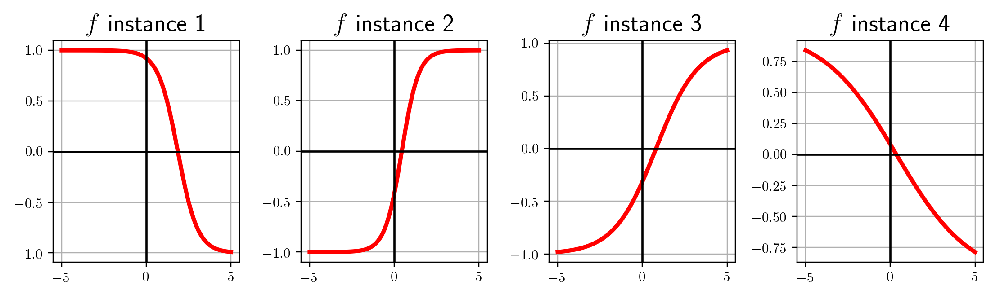

In [94]:
## This code cell will not be shown in the HTML version of this notebook
# build 4 instances of a composition basis: line and tanh
x = np.linspace(-5,5,100)
fig = plt.figure(figsize = (10,3))

for m in range(1,5):
    # make basis element
    w_0 = np.random.randn(1)
    w_1 = np.random.randn(1)
    fm = np.tanh(w_0 + w_1*x)
    fm_table = np.stack((x,fm),axis = 1)
    
    # plot the current element
    ax = fig.add_subplot(1,4,m)
    ax.plot(fm_table[:,0],fm_table[:,1],c='r',linewidth = 3)
    ax.set_title('$f$ instance ' + str(m),fontsize = 18)

    # clean up plot
    ax.grid(True, which='both')
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')

plt.show()

Choosing another elementary function gives another sub-catalog of single-layer neural network functions.  The rectified linear unit (or 'relu' for short) is another popular example, elements of which (for single dimensional input) look like

\begin{equation}
f_1(x) = \text{max}\left(0,w_{1,0} + w_{1,1}x\right), ~~ f_2(x) = \text{max}\left(0,w_{2,0} + w_{2,1}x\right), ~~ f_3(x) = \text{max}\left(0,w_{3,0} + w_{3,1}x\right), ~~ f_4(x) = \text{max}\left(0,w_{4,0} + w_{4,1}x\right), ...
\end{equation}

Since these also have internal parameters each can once again take on a variety of shapes.  Below we plot $4$ instances of such a function, where in each case its *internal parameters* have been set at random.

<IPython.core.display.Javascript object>


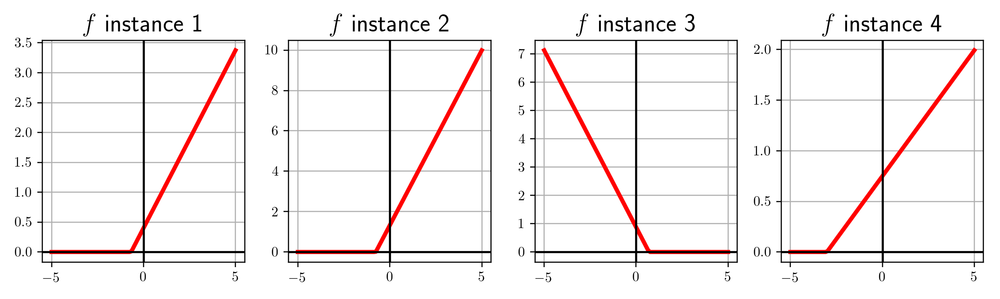

In [104]:
## This code cell will not be shown in the HTML version of this notebook
# build 4 instances of a composition basis: line and tanh
x = np.linspace(-5,5,100)
fig = plt.figure(figsize = (10,3))

for m in range(1,5):
    # make basis element
    w_0 = np.random.randn(1)
    w_1 = np.random.randn(1)
    fm = np.maximum(0,w_0 + w_1*x)
    fm_table = np.stack((x,fm),axis = 1)
    
    # plot the current element
    ax = fig.add_subplot(1,4,m)
    ax.plot(fm_table[:,0],fm_table[:,1],c='r',linewidth = 3)
    ax.set_title('$f$ instance ' + str(m),fontsize = 18)

    # clean up plot
    ax.grid(True, which='both')
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')

plt.show()

To handle higher dimensional input we simply take a linear combination of the input, passing the result through the nonlinear function.  For example, an element $f_j$ for general $N$ dimensional input looks like the following using the relu function

\begin{equation}
f_j\left(\mathbf{x}\right) = \text{max}\left(0,w_{j,0} + w_{j,1}x_1 + \cdots + w_{j,\,N}x_N\right).
\end{equation}

As with the lower dimensional single layer functions, each such function can take on a variety of different shapes based on how we tune its internal parameters.  Below we show $4$ instances of such a function with $N=2$ dimensional input.

<IPython.core.display.Javascript object>


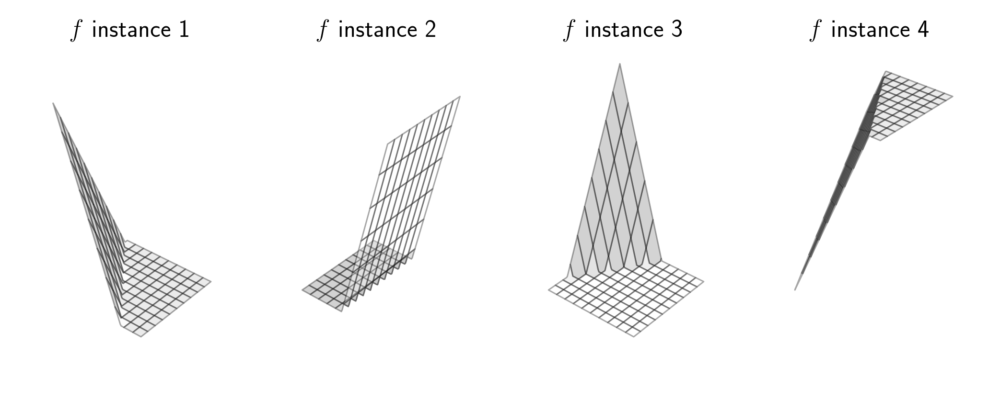

In [47]:
## This code cell will not be shown in the HTML version of this notebook
# generate input values
s = np.linspace(-2,2,100)
x_1,x_2 = np.meshgrid(s,s)
degree_dict = {}

# build 4 polynomial basis elements
fig = plt.figure(num=None, figsize = (10,4), dpi=80, facecolor='w', edgecolor='k')

### plot regression surface ###
p =  [0,1,1,2]
q = [1,2,1,3]
for m in range(4):
    ax1 = plt.subplot(1,4,m+1,projection = '3d')
    ax1.set_axis_off()
    
    # random weights
    w_0 = np.random.randn(1)
    w_1 = np.random.randn(1)
    w_2 = np.random.randn(1)
    w_3 = np.random.randn(1)
    f_m = w_3*np.maximum(0,w_0 + w_1*x_1 + w_2*x_2)

    ax1.plot_surface(x_1,x_2,f_m,alpha = 0.35,color = 'w',zorder = 3,edgecolor = 'k',linewidth=1,cstride = 10, rstride = 10)
    ax1.view_init(20,40) 
    ax1.set_title('$f$ instance ' + str(m+1),fontsize = 18)

fig.subplots_adjust(left=0,right=1,bottom=0,top=1)   # remove whitespace around 3d figure
plt.show()

Other 'deeper' elements of the neural network family are constructed by *recursively combining* single layer elements.  For example, to create a *two-layer neural network function* we take a linear combination of single layer elements, like the $\text{tanh}$ ones shown above, and pass the result through same $\text{tanh}$ function e.g., summing $10$ elements and passing the result through $\text{tanh}$ gives a 'two-layer' function.  With this we have created an even more flexible function, since each internal single-layer function $f_j$ also has internal parameters, which we illustrate by example below.  Here we show $4$ random instances of the above neural network function, where in each instance we have randomly set all of its parameters.  As can be seen below, these instances are far more flexible than the single-layer ones.

We go into substantially further detail in discussing this family of universal approximators in Chapter 13.

<IPython.core.display.Javascript object>


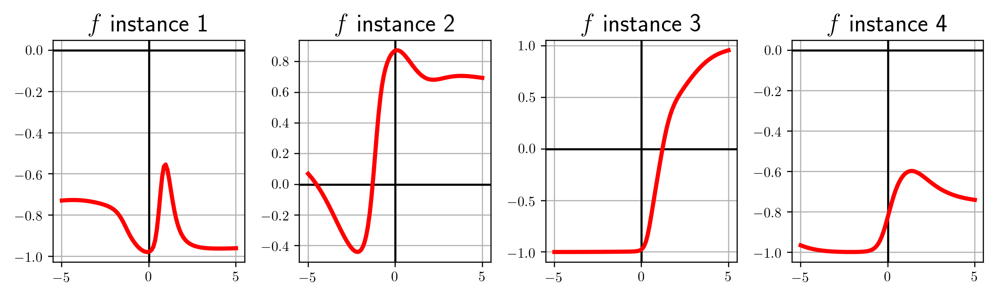

In [129]:
## This code cell will not be shown in the HTML version of this notebook
# build 4 instances of a composition basis: line and tanh and tanh
x = np.linspace(-5,5,100)
fig = plt.figure(figsize = (10,3))

for m in range(1,5):
    # make basis element
    fm = 0
    for j in range(10):
        w_0 = np.random.randn(1)
        w_1 = np.random.randn(1)
        w_3 = np.random.randn(1)
        fm+=w_3*np.tanh(w_0 + w_1*x)
    w_2 = np.random.randn(1)
    w_3 = np.random.randn(1)
    
    fm = np.tanh(w_2 + fm)
    fm_table = np.stack((x,fm),axis = 1)
    
    # plot the current element
    ax = fig.add_subplot(1,4,m)
    ax.plot(fm_table[:,0],fm_table[:,1],c='r',linewidth = 3,zorder = 3)
    ax.set_title('$f$ instance ' + str(m),fontsize = 18)

    # clean up plot
    ax.grid(True, which='both')
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')

plt.show()

### The tree family of universal approximators

Like neural networks, a single element from the family of tree-based universal approximators can take on a wide array of shapes.  The simplest sort of tree basis consists of discrete step functions or, as they are more commonly referred to, *stumps* whose break lies along a single dimension of the feature space.  A stump with 1-dimensional input $x$ can be written as 

\begin{equation}
f_1(x) = \begin{cases} x < V_1 \,\,\,\,\, a_1 \\ x \geq  V_1 \,\,\,\,\, b_1   \end{cases}  ~~~~~~~~
f_2(x) = \begin{cases} x < V_2 \,\,\,\,\, a_2 \\ x \geq  V_2 \,\,\,\,\, b_2  \end{cases} ~~ \cdots
\end{equation}


where $V_{1}$ is split point at which the stump changes values, and $y_{1}$ and $y_{2}$ are values taken by the two sides of the stump, respectively, which we refer to as *levels* of the stump.

<figure>
<p>
  <img src= '../../mlrefined_images/nonlinear_superlearn_images/depth1.png' width="85%" height="65%" alt=""/>
</p>
<figcaption> <strong>Figure 1:</strong> <em> 
An illustration of a *stump* function from the family of tree-based universal approimators.  Here $V_1$ is called the *split point* and $y_1$ / $y_2$ the *levels* of the function.
</em>
</figcaption>
</figure>

Below we plot four instances of such a stump basis element - where we can see how each one takes on a wide variety of shapes.

<IPython.core.display.Javascript object>


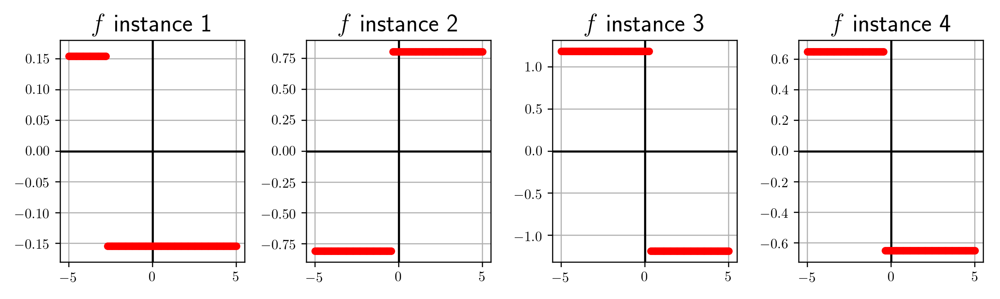

In [112]:
## This code cell will not be shown in the HTML version of this notebook
# build 4 instances of a composition basis: line and tanh
x = np.linspace(-5,5,100)
fig = plt.figure(figsize = (10,3))

for m in range(1,5):
    # make basis element
    w_0 = np.random.randn(1)
    w_1 = np.random.randn(1)
    w_2 = np.random.randn(1)
    fm = w_2*np.sign(w_0 + w_1*x)
    fm_table = np.stack((x,fm),axis = 1)
    
    # plot the current element
    ax = fig.add_subplot(1,4,m)
    ax.scatter(fm_table[:,0],fm_table[:,1],c='r',s = 20,zorder = 3)
    ax.set_title('$f$ instance ' + str(m),fontsize = 18)

    # clean up plot
    ax.grid(True, which='both')
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')

plt.show()

Higher dimensional stumps follow this one dimensional pattern: a split point $V_1$ is defined along a *single* dimension, defining a linear step along a single coordinate dimension.  Each side of the split is then assigned a single level value.  Below we plot four instances of a single stump defined in two dimensions.  Here the split point is defined along a value on either the $x_1$ or $x_2$ axis, producing a step that is a line along one coordinate axes. 

<IPython.core.display.Javascript object>


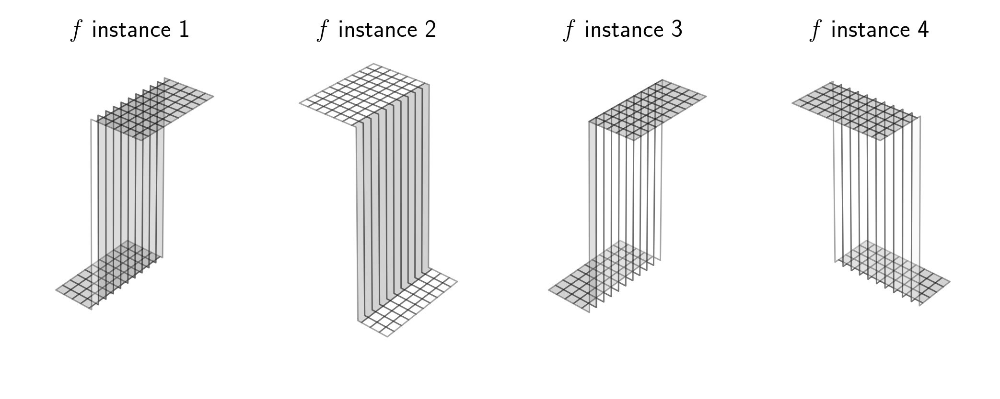

In [46]:
## This code cell will not be shown in the HTML version of this notebook
# generate input values
s = np.linspace(-2,2,100)
x_1,x_2 = np.meshgrid(s,s)
degree_dict = {}

# build 4 polynomial basis elements
fig = plt.figure(num=None, figsize = (10,4), dpi=80, facecolor='w', edgecolor='k')

### plot regression surface ###
for m in range(4):
    ax1 = plt.subplot(1,4,m+1,projection = '3d')
    ax1.set_axis_off()
    
    # random weights
    r = np.random.randint(2)
    w_0 = 0.1*np.random.randn(1)
    w_1 = np.random.randn(1)*r
    w_2 = np.random.randn(1)*(1 - r)
    w_3 = 3*np.random.randn(1)
    f_m = w_3*np.sign(w_0 + w_1*x_1 + w_2*x_2)
    
    ax1.plot_surface(x_1,x_2,f_m,alpha = 0.35,color = 'w',zorder = 3,edgecolor = 'k',linewidth=1,cstride = 10, rstride = 10)
    ax1.view_init(20,40) 
    ax1.set_title('$f$ instance ' + str(m+1),fontsize = 18)

fig.subplots_adjust(left=0,right=1,bottom=0,top=1)   # remove whitespace around 3d figure
plt.show()

To create a more flexible decision tree basis function we split each level of the stump.  This gives us a *tree* of depth 2 (our first split gave us a stump, another phrase for stump is tree of depth 1).  We can look at this mathematically / figuratively as in the figure below.


<figure>
<p>
  <img src= '../../mlrefined_images/nonlinear_superlearn_images/depth2.png' width="85%" height="65%" alt=""/>
</p>
<figcaption> <strong>Figure 2:</strong> <em> 
An illustration of a depth two tree function from the family of tree-based universal approimators.  Here $V_1$, $V_2$, and $V_3$ are called *split points* and $y_1$ / $y_2$ / $y_3$ / $y_4$ the *levels* of the function.
</em>
</figcaption>
</figure>


This gives a basis element with four (potentially) distinct levels.  Since the location of the splits and the values of the levels can be set in many ways, this gives each element of a tree basis of depth 2 a good deal more flexibility than stumps.  Below we illustrate $4$ instances of a depth $2$ tree.

We describe trees in significantly further detail in Chapter 14.

<IPython.core.display.Javascript object>


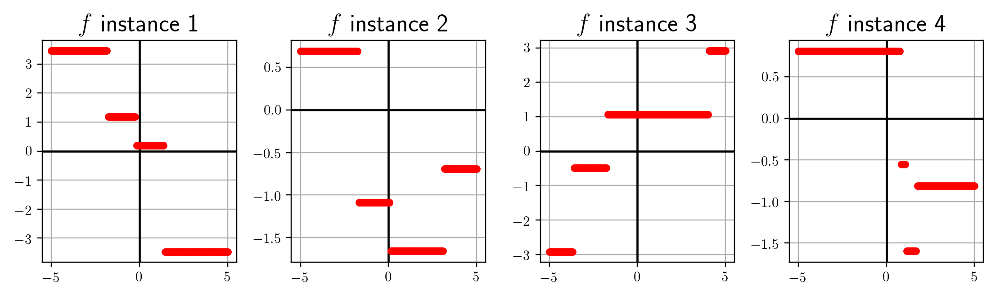

In [54]:
## This code cell will not be shown in the HTML version of this notebook
# build 4 instances of a composition basis: line and tanh
x = np.linspace(-5,5,100)
fig = plt.figure(figsize = (10,3))

for m in range(1,5):
    # make basis element
    w_0 = 0.1*np.random.randn(1)
    w_1 = 0.1*np.random.randn(1)
    w_2 = np.random.randn(1)
    fm = w_2*np.sign(w_0 + w_1*x)
    
    # make basis element
    w_0 = 0.1*np.random.randn(1)
    w_1 = 0.1*np.random.randn(1)
    w_2 = np.random.randn(1)
    gm = w_2*np.sign(w_0 + w_1*x)
    
    # make basis element
    w_0 = 0.1*np.random.randn(1)
    w_1 = 0.1*np.random.randn(1)
    w_2 = np.random.randn(1)
    bm = w_2*np.sign(w_0 + w_1*x)
    fm += gm
    fm += bm
    fm_table = np.stack((x,fm),axis = 1)
    
    # plot the current element
    ax = fig.add_subplot(1,4,m)
    ax.scatter(fm_table[:,0],fm_table[:,1],c='r',s = 20,zorder = 3)
    ax.set_title('$f$ instance ' + str(m),fontsize = 18)

    # clean up plot
    ax.grid(True, which='both')
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')

plt.show()

## 11.1.3  Tuning universal approximators to 'perfect' data

Given a piecewise continuous function $h\left(\mathbf{x}\right)$ and a set of universal approximators parameters approximators $f_1,...,f_B$, how do we best tune the parameters of their linear combination so that - at the very least - we have a good approximation?  Stated more formally if we use a linear combination of these approximators as our `model`

\begin{equation}
\text{model}\left(\mathbf{x},\mathbf{w}\right) =   w_0 + f_1\left(\mathbf{x}\right){w}_{1} +  f_2\left(\mathbf{x}\right){w}_{2} + \cdots + f_B\left(\mathbf{x}\right)w_B.
\end{equation}

how do we tune all of the parameters in $\mathbf{w}$ - which includes the weights of our linear combination $w_0,\,w_1,...,w_B$ as well as any possible internal parameters of the universal approximators themselves - so that we can at the very least approximate $h\left(\mathbf{x}\right)$ using this linear combination as

\begin{equation}
\text{model}\left(\mathbf{x},\mathbf{w}\right) \approx h\left(\mathbf{x}\right).
\end{equation}

Lets appreciate for a moment just what a general question this is, since we are saying that $h$ can be in general any piecewise continuous function.  

As illustrated figuratively below, the aim of correctly tuning parameters in here is actually a case of *regression*.  More specifically, it is an instance of what we call 'perfect' regression - where by 'perfect' we mean that in such a case we have a complete, noise free set of input/output data (the set of points defining the function $h$).  For every input point $\mathbf{x}_p$ we have a correpsonding output $y_p = h\left(\mathbf{x}_p\right)$, and so have a very large set of input/output pairs defining the entire function $\left \{\mathbf{x}_p,\, y_p\right\}_{p=1}^P$ (technically $P$ would be infinity, but we can suppose instead that it is just very very large).

So - in other words - to tune the parameters of our model to get the best possible fit to a nonlinear function we can simply *minimize a cost function*.  Here - for the sort of nonlinear functions shown in the figure below - it seems most natural to use a Least Squares of Least Absolute deviations cost.

<tr>
   <td>
  <img src= '../../mlrefined_images/nonlinear_superlearn_images/linear_regression_to_funcapprox.gif' width="70%" height="70%" alt=""/>
  </td>
  <td>
  <img src= '../../mlrefined_images/nonlinear_superlearn_images/nonlinear_regression_to_funcapprox.gif' width="50%" height="25%" alt=""/>
  </td>
 </tr>

<figure>
 <figcaption> <strong>Figure 1:</strong> <em> 
Here with the gif in the left panel we start off by showing a realistic linear regression dataset (a small noisy set of points that can be roughly modeled by a line).  We progress to remove all noise from those points (making them all lie perfectly on some line), and finally show the perfect linear regression scenario where we have infinitely many points lying perfectly on a line. 

In the gif in the right panel we start off by showing a realistic nonlinear regression dataset (a small noisy set of points that can be roughly modeled by a nonlinear curve).  We then progress to remove all noise from those points (making them all lie perfectly on some curve), and finally show the perfect nonlinear regression scenario where we have infinitely many points lying perfectly on the curve itself. 
</em>
</figcaption>
</figure>

This indeed how we produced the first animation shown above in Section 12 - the continuous function shown there actually consists of $10,000$ input/output points, and we used $B = 300$ single layer neural network functions with $\text{tanh}$ function (precisely like those detailed in the previous Subsection) to minimize the Least Squares cost

\begin{equation}
g\left(\mathbf{w}\right) = \frac{1}{P}\sum_{p=1}^{P}\left(\text{model}\left(\mathbf{x}_p,\mathbf{w}\right) - y_p\right)^2
\end{equation}

using gradient descent.  Below we re-plot this animation, but show the cost function history plot as well.  You can track which weights from the run of gradient descent are currently being used `model` by a small red dot we have placed on the cost history plot.  As yo move the slider from left to right the weights, and overall fit of the `model`, progress while the red dot on the cost function history traces out which step of the descent run we is currently being shown in the left panel.


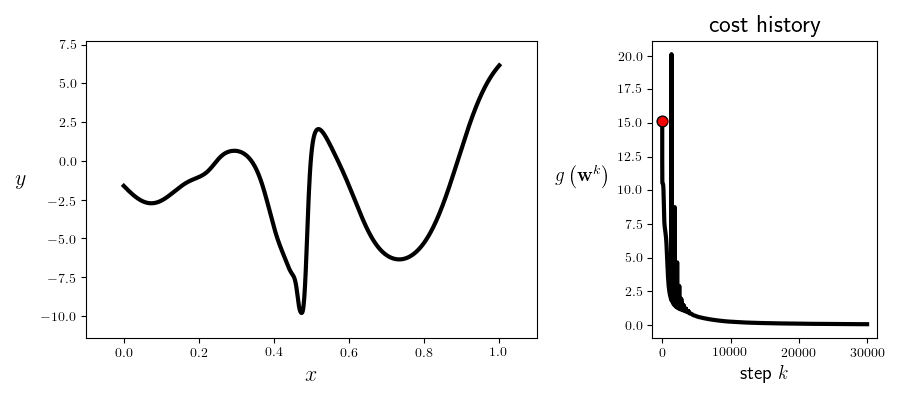
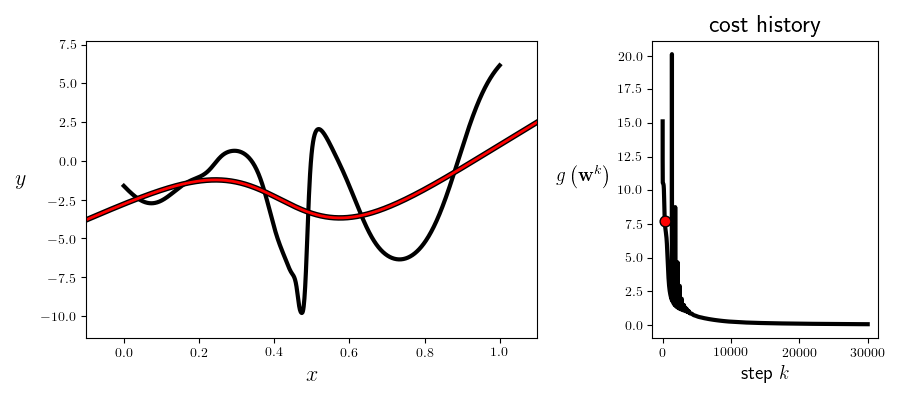
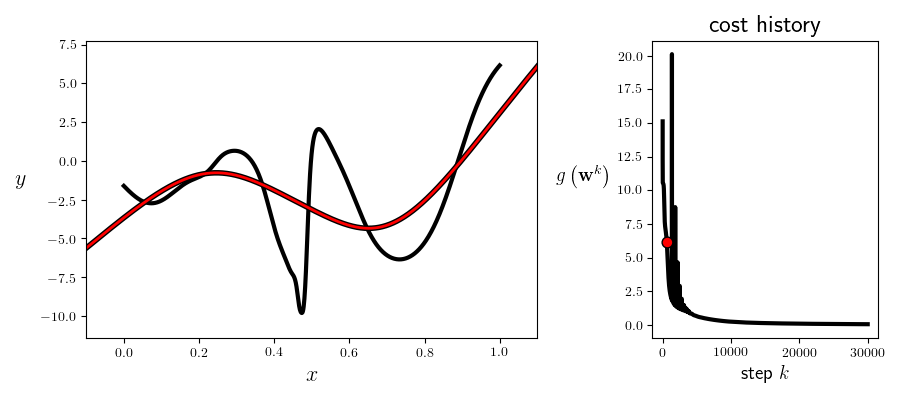
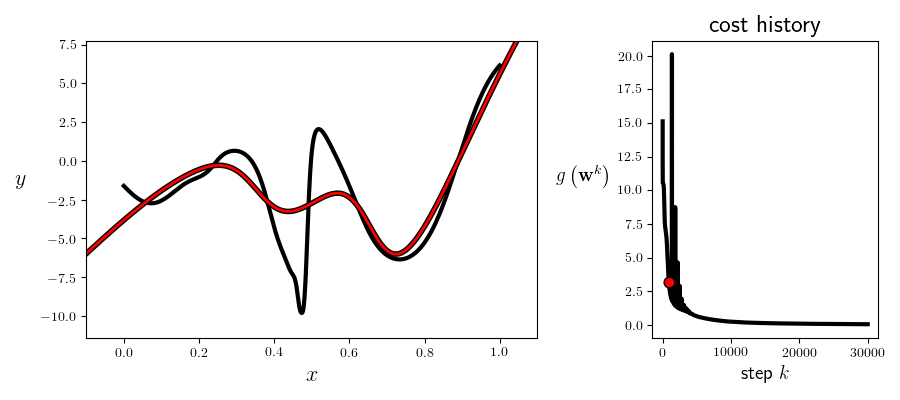
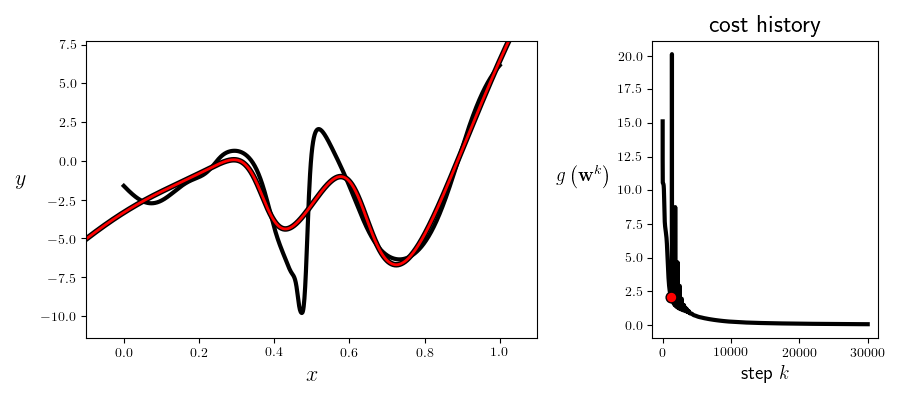
...
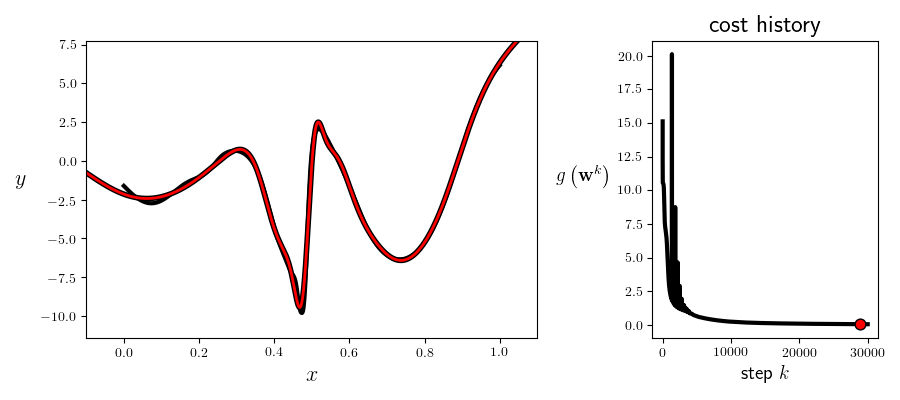
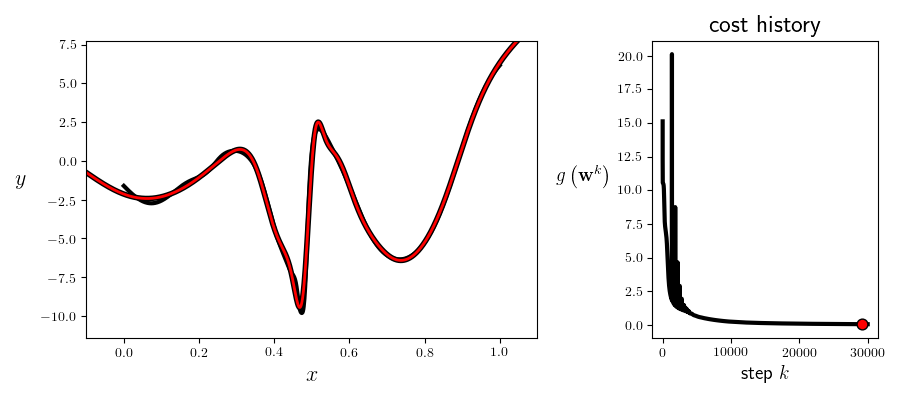
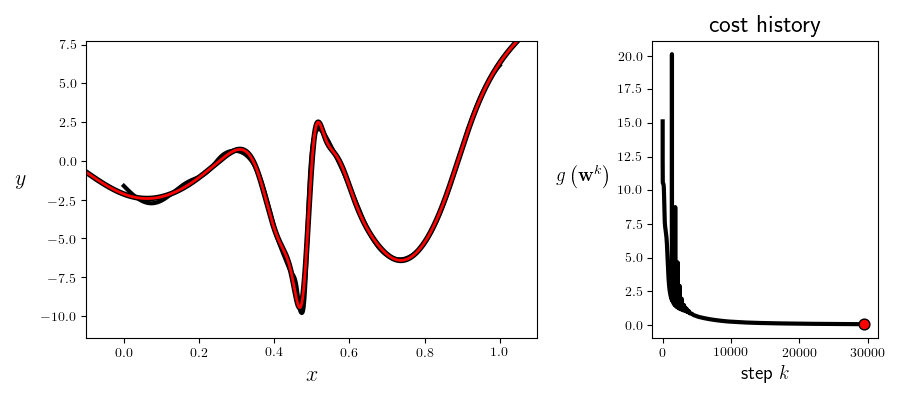
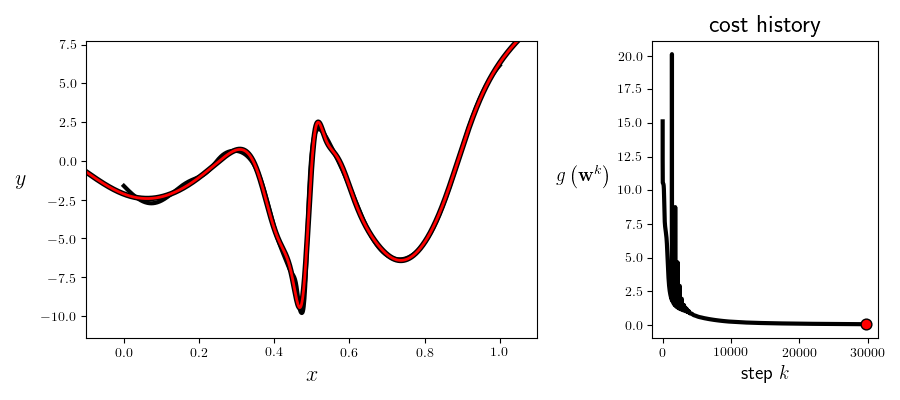
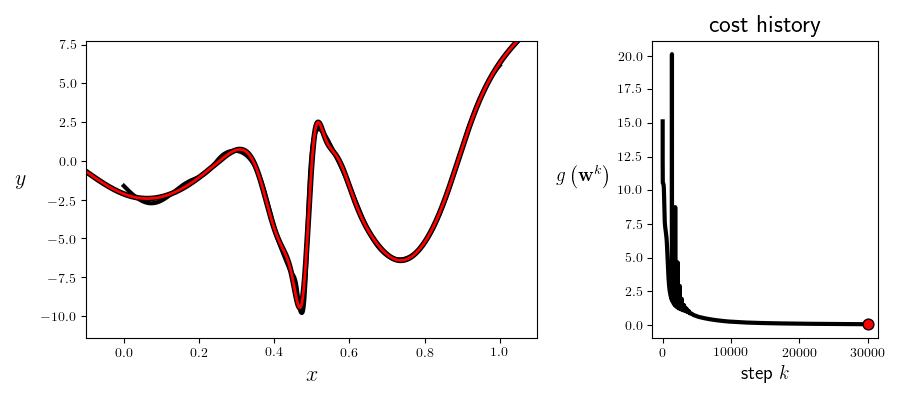

In [98]:
## This code cell will not be shown in the HTML version of this notebook
# pluck out a sample of the weight history
num_frames = 100 # how many evenly spaced weights from the history to animate

# animate based on the sample weight history
demo1.animate_1d_regression(mylib1,num_frames,scatter = 'none',show_history = True)

In the same vein our classification cost functions are ideal for tuning hte parameters of a `model` when the function takes on discrete steps, like the one shown in the second animation in Subsection 12.5.2.  There we had a funciton consisting of discrete steps taking on the values $\pm 1$, which we can think of as an example of a 'perfect' case of two-class classification data.  Below we illustrate two figurative examples of such 'perfect' classification data - a linear and nonlinear separable dataset. In both cases the 'perfect' dataset consists of a very large, noise free set of data.  In the context of classification 'noise' means 'incorrectly labeled', thus if we think about such a 'perfect' classification dataset it is indeed a *step function* with arbitrary boundary.

<tr>
   <td>
<img src= '../../mlrefined_images/nonlinear_superlearn_images/linear_classification_to_funcapprox.gif' width="800%" height="800%" alt=""/>
  </td>
  <td>
<img src= '../../mlrefined_images/nonlinear_superlearn_images/nonlinear_classification_to_funcapprox.gif' width="55%" height="60%" alt=""/>
  </td>
 </tr>

 <figure>
 <figcaption> <strong>Figure 2:</strong> <em> 
In the first gif on the left we start off by showing a realistic linear classification dataset (a small noisy set of points that can be roughly modeled by a step function).  We then progress to remove all noise from those points (i.e., returning the true label values to our 'noisy' points), and finally show the perfect linear classification scenario where we have infinitely many points lying perfectly on a step function with linear boundary. 


In gif on the right we start off by showing a realistic nonlinear classification dataset (a small noisy set of points that can be roughly modeled by a step function with nonlinear boundary).  We then progress to remove all noise from those points (i.e., returning the true label values to our 'noisy' points), and finally show the perfect nonlinear classification scenario where we have infinitely many points lying perfectly on a step function with nonlinear boundary. 
</em>
</figcaption>
</figure>

Indeed to create the fit shown in the second animation of Subsection 12.5.1 above we tuned the `model` parameters by minimizing the corresponding softmax cost function

\begin{equation}
g\left(\mathbf{w}\right) = \frac{1}{P}\sum_{p=1}^{P}\text{log}\left(1 + e^{-y_p\text{model}\left(\mathbf{x}_p,\mathbf{w}\right)}\right).
\end{equation}

Below we replot this animation, showing the corresponding softmax cost function history along with the animated fit.  As with the animation above you can visually track which step of gradient descent is currently being used by the `model` when you move the slider from left to right by the red dot shown on the cost function history plot.


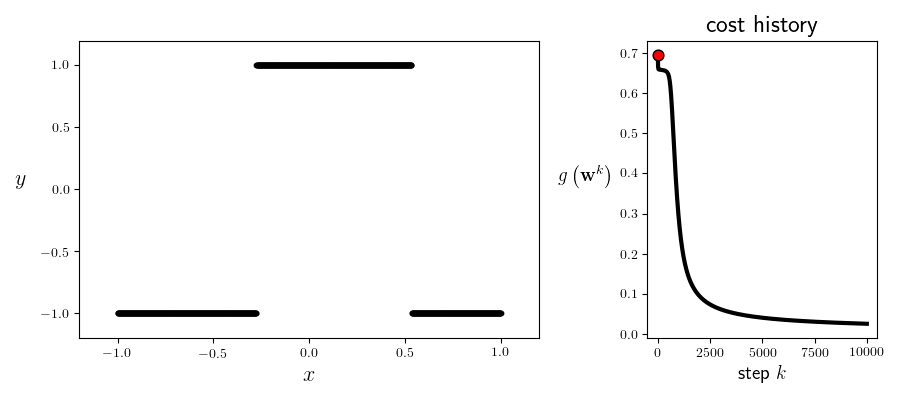
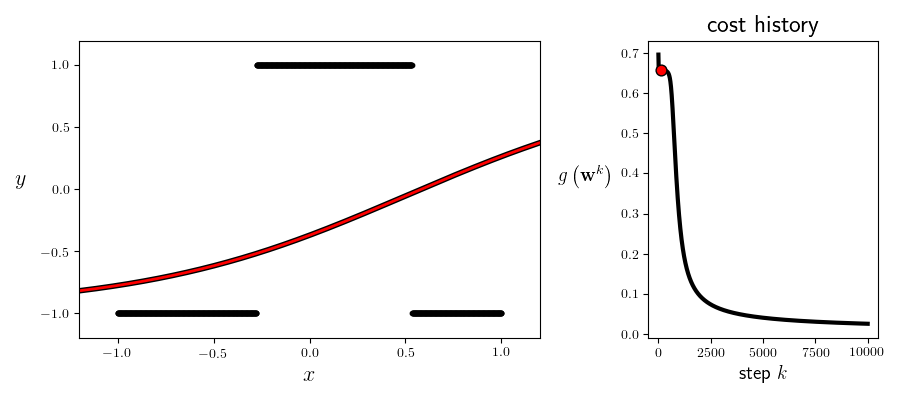
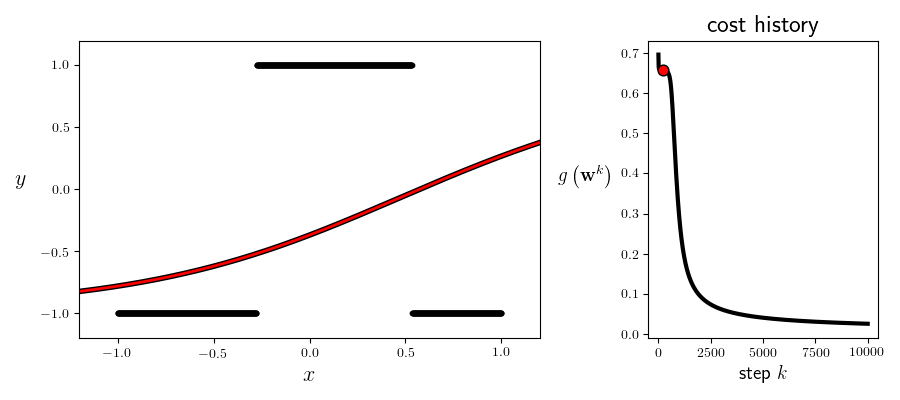
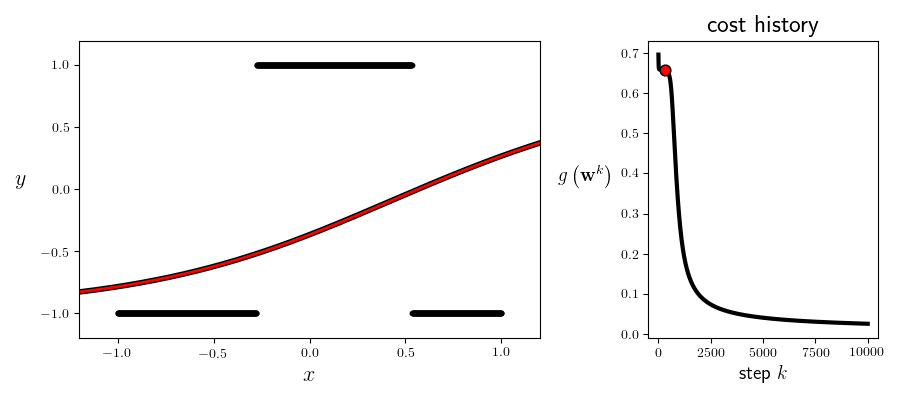
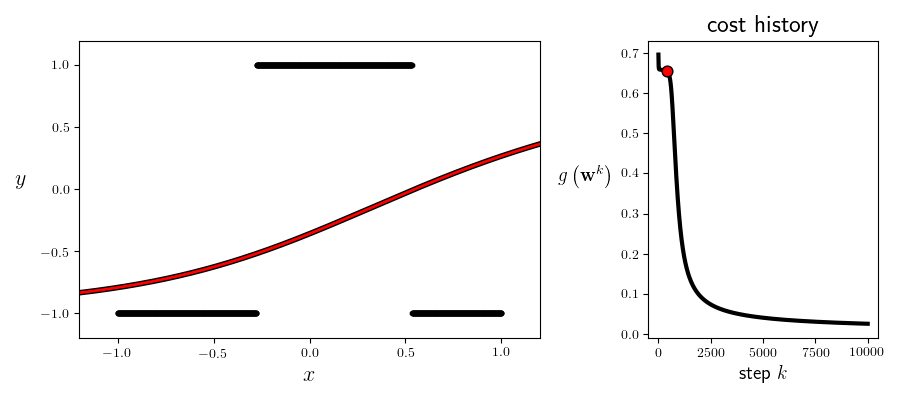
...
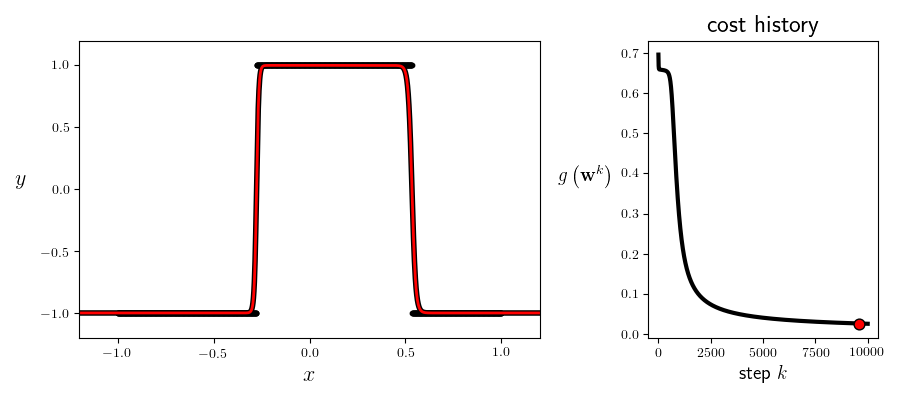
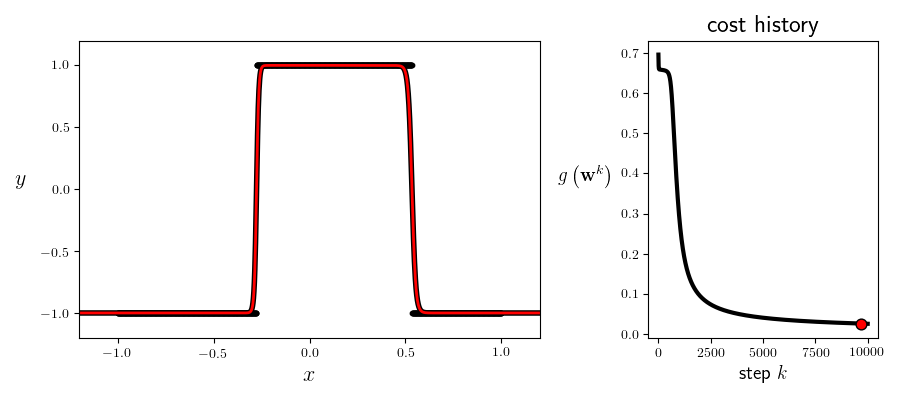
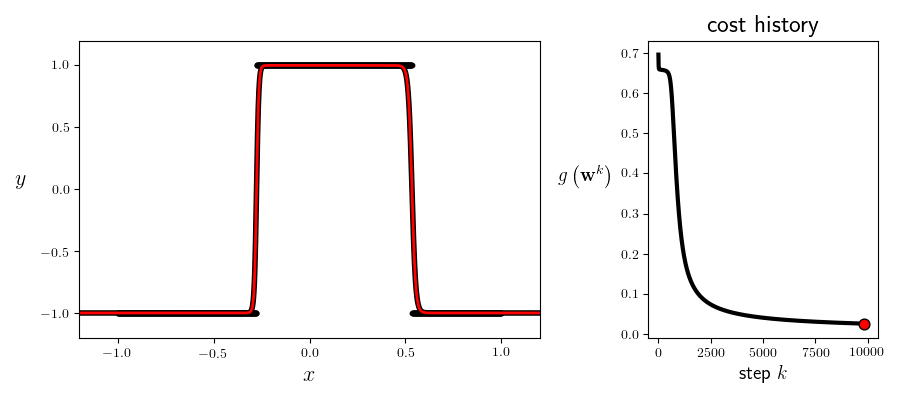
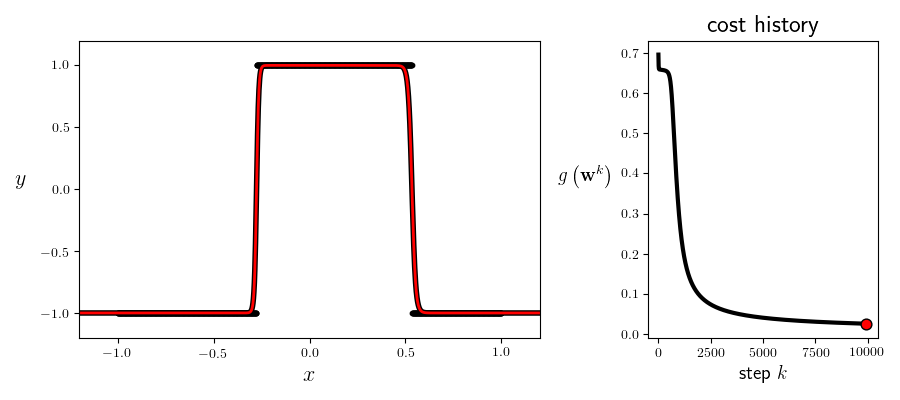
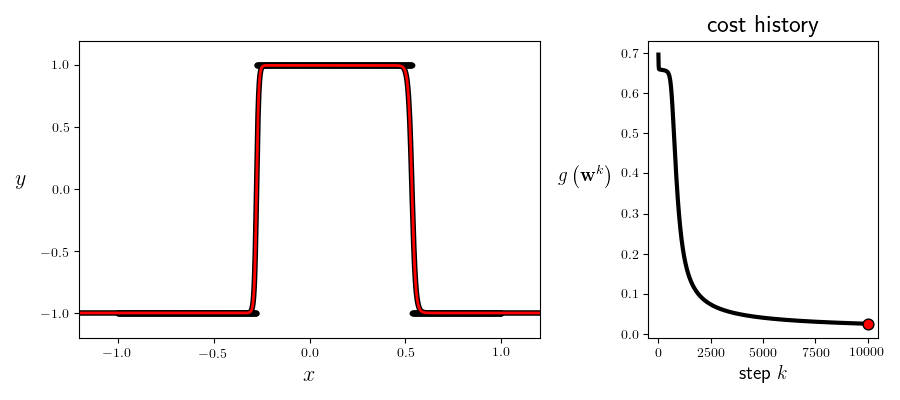

In [100]:
## This code cell will not be shown in the HTML version of this notebook
# load up animator
demo2 = nonlib.run_animators.Visualizer(csvname)

# pluck out a sample of the weight history
num_frames = 100 # how many evenly spaced weights from the history to animate

# animate based on the sample weight history
demo2.animate_1d_regression(mylib2,num_frames,scatter = 'function',show_history = True)

Another example - this time in three dimensions - is given below.  Here we color all points of the function according to our usual coloring scheme for two-class classification: points with output value $+1$ are colored red, while those with output value $-1$ are colored blue.  We use the polynomial approximators here, and minimize the softmax cost using Newton's method.  In the left panel we view this dataset 'from above', and visualize the learned surface's intersection with the plane $y = 0$ (the decision boundary) as a series of black curves.  On the right the data is shown in three dimensions and the learned surface, where the learned surface is given a grid texture so that it is more visually distinct from the function itself.  As you pull the slider from left to right the weights used vary from those at the beginning of the run to the end, where the fit is optimal. 


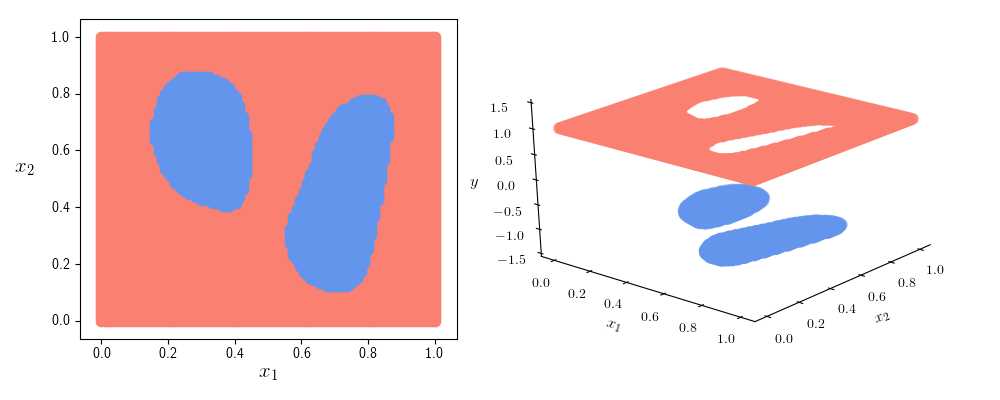
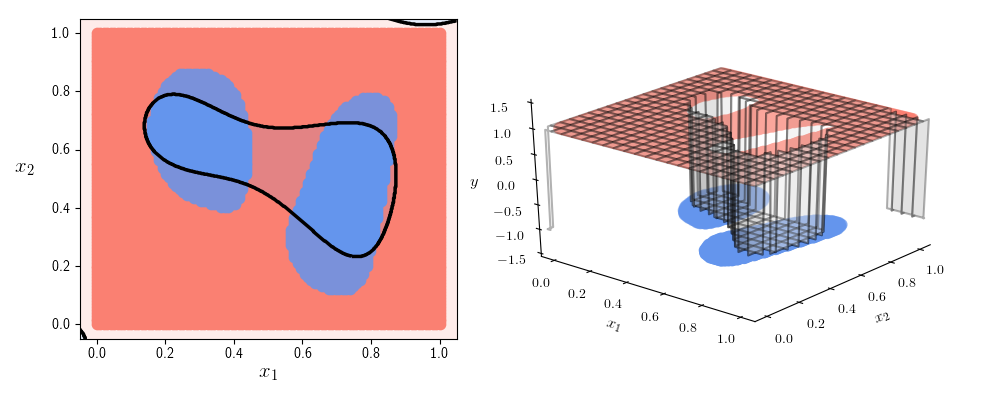
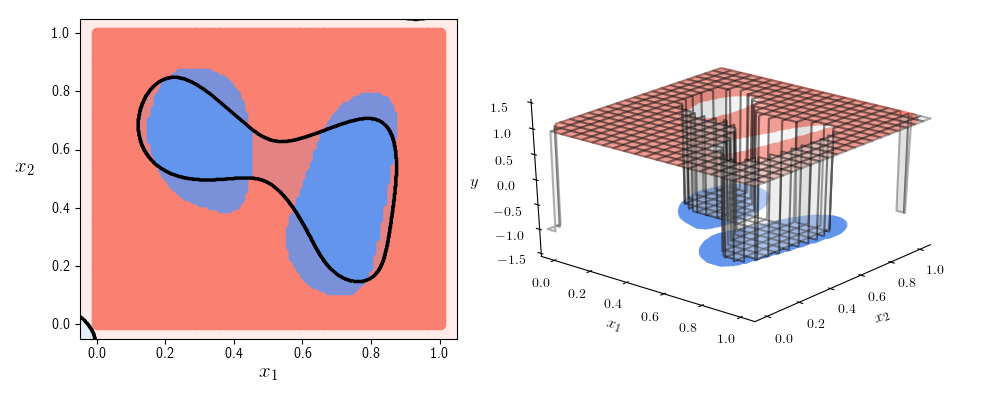
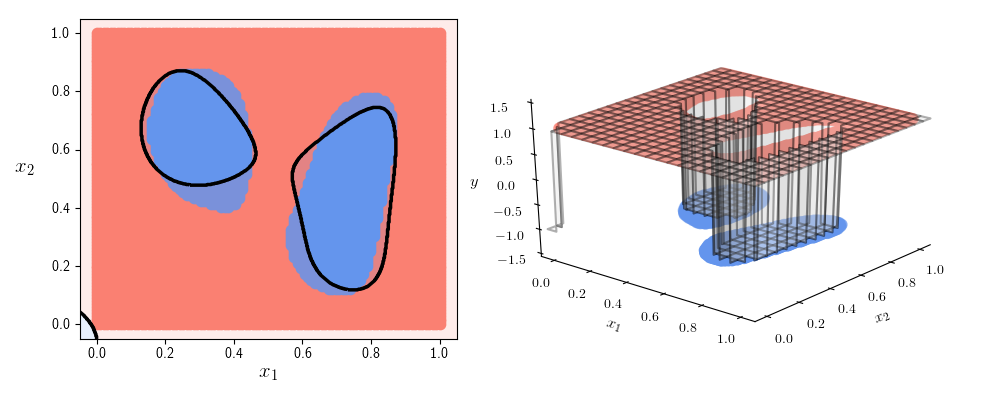
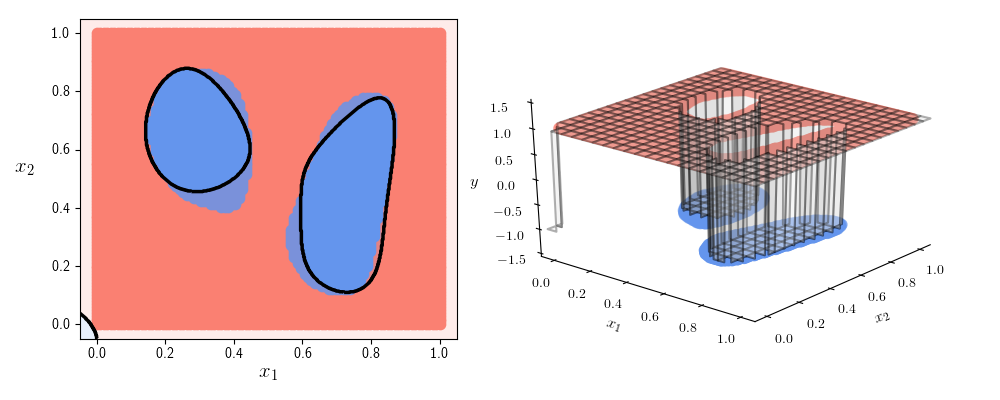
...
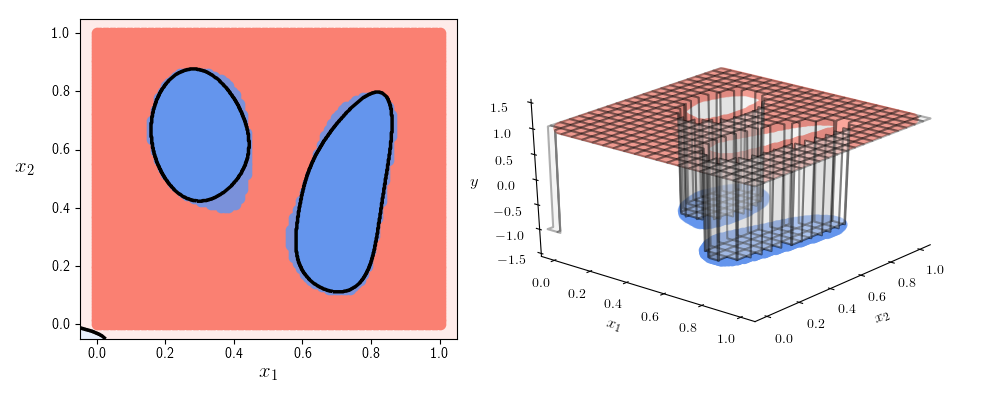
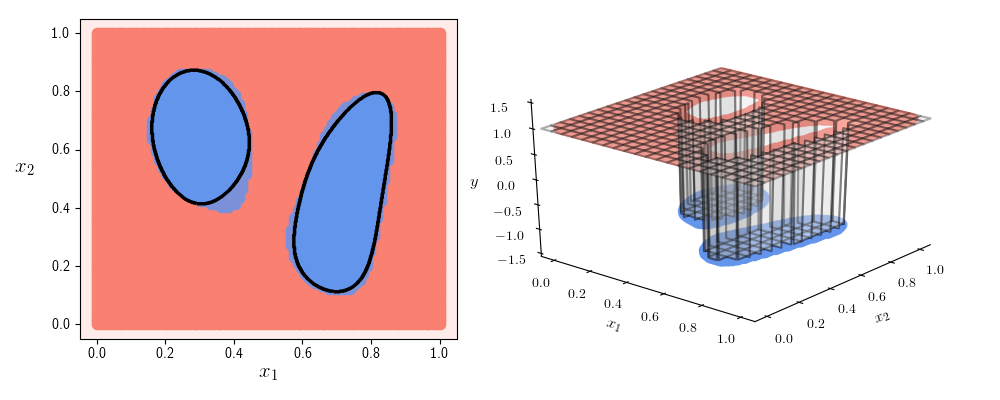
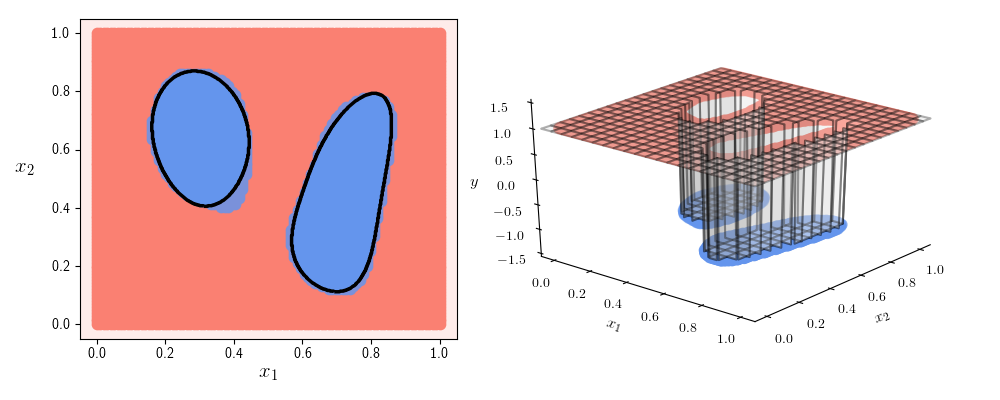
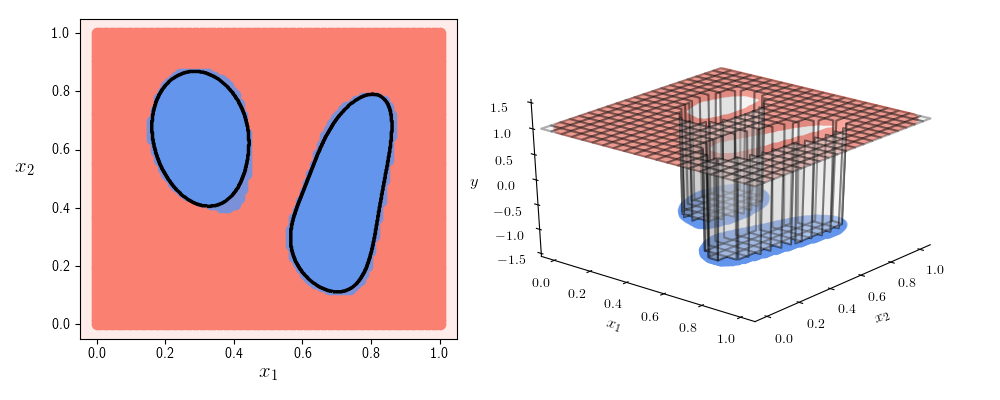
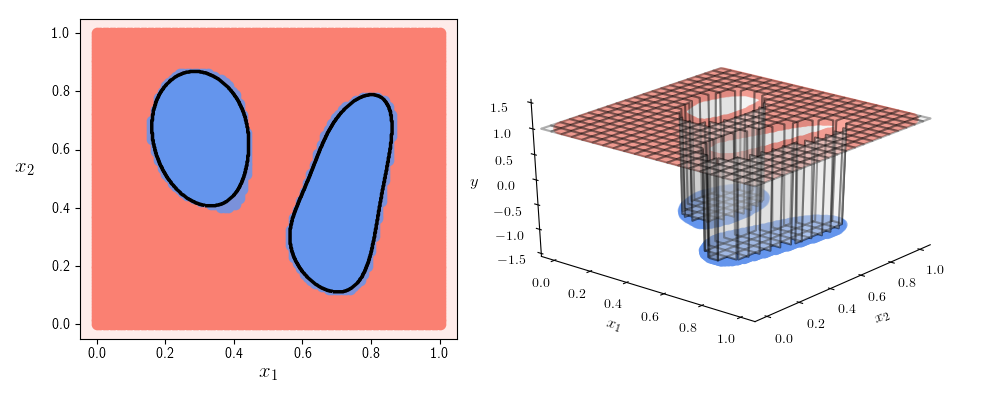

In [204]:
## This code cell will not be shown in the HTML version of this notebook
# load in data
csvname = datapath + '2eggs_function.csv'
data = np.loadtxt(csvname,delimiter = ',')
x = data[:-1,:]
y = data[-1:,:] 

# import the v1 library
mylib3 = nonlib.library_v1.superlearn_setup.Setup(x,y)

# choose features
mylib3.choose_features(name = 'polys',degree = 5)

# choose normalizer
mylib3.choose_normalizer(name = 'none')

# choose cost
mylib3.choose_cost(name = 'softmax')

# fit an optimization
mylib3.fit(optimizer = 'newtons method',max_its = 10,epsilon = 10**(-9))

# plot
demo3 = nonlib.run_animators.Visualizer(datapath + '2eggs_function.csv')
frames = 10
demo3.animate_static_N2_simple(mylib3,frames,show_history = False,scatter = 'off',view = [30,-50])

The same sort of idea detailed here also holds for multiclass classificaiton as well as unsupervised learning (e.g.,, the nonlinear autoencoder) - their 'perfect' versions are also complete mathematical functions.  For all such 'perfect' data - whether it supervised or unsupervised - the moral is this: for 'perfect' data improving the weights of a `model` consisting of a linear combination of universal approximations by minimizing an associated cost function *always* improves the `model`'s fit.  Likewise, increasing $B$ the number of universal approximators used in a `model` and properly tuning its parameters always improves the `model`'s fit.

> For 'perfect' data improving the weights of a `model` consisting of a linear combination of universal approximations by minimizing an associated cost function *always* improves the `model`'s fit.  Likewise, increasing $B$ the number of universal approximators used in a `model` and properly tuning its parameters always improves the `model`'s fit.

This moral holds regardless of the set of universal approximators we choose - whether it be kernels, neural networks, or trees.  We illustrate this graphically below using a simple 'perfect' regression dataset, and regress an increasing number of elements or 'units' from each catalog.  In the left, middle, and right panels we show the result of fitting an increasing number of polynomial, single layer tanh, and tree units respectively.  As you move the slider from left to right you can see the result of fitting more and more of these units, with the result being the same in each instance: we get a better fit to the 'perfect' data. 


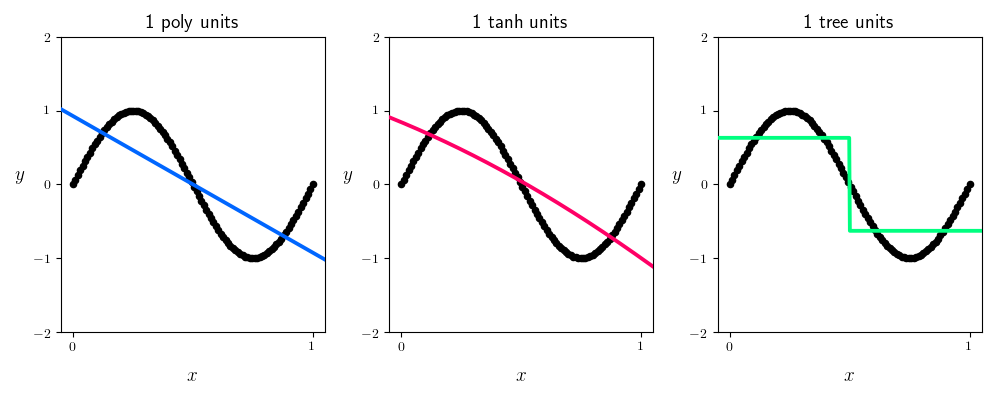
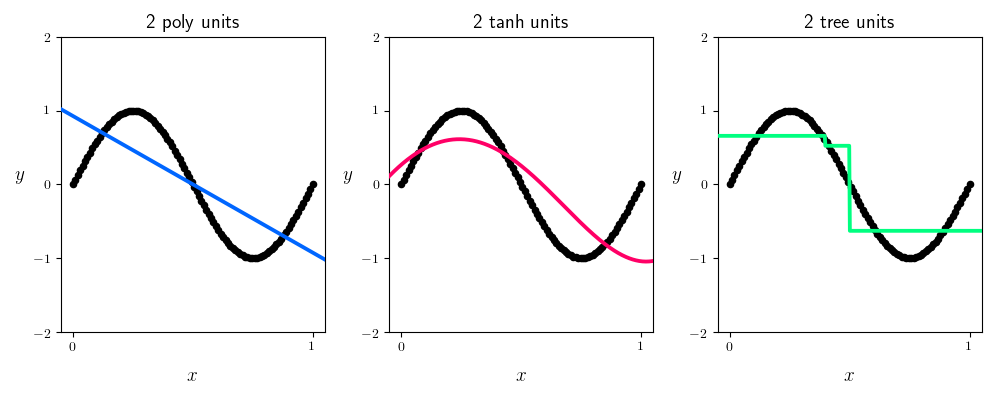
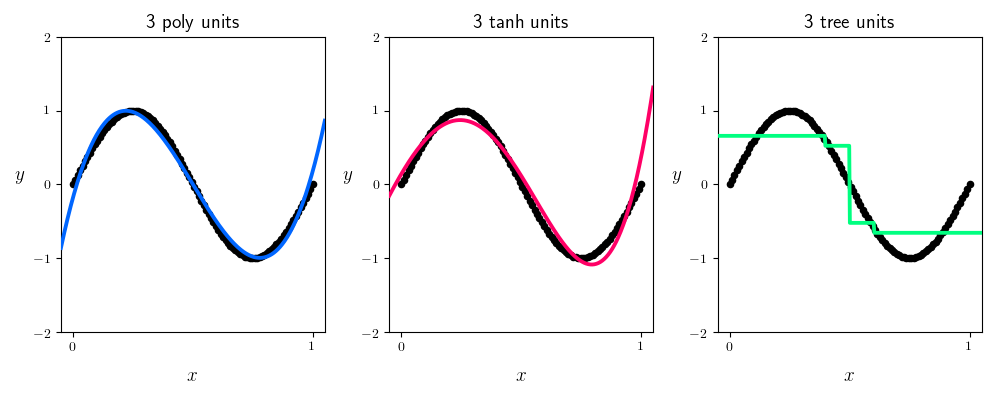
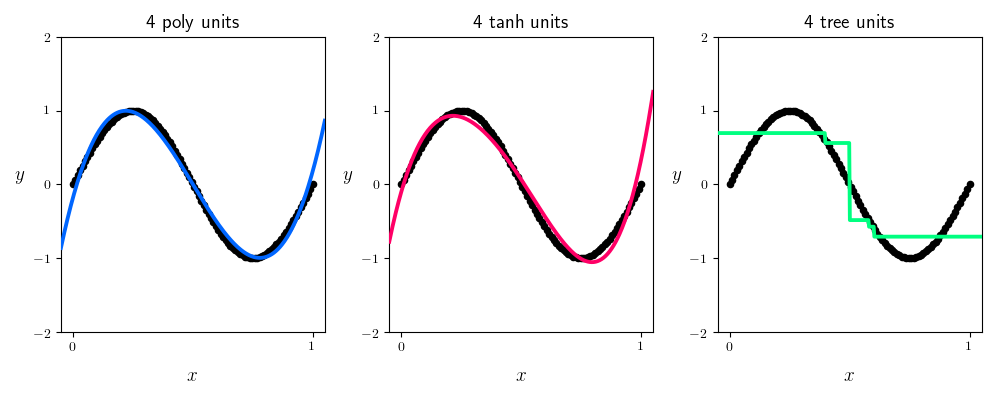
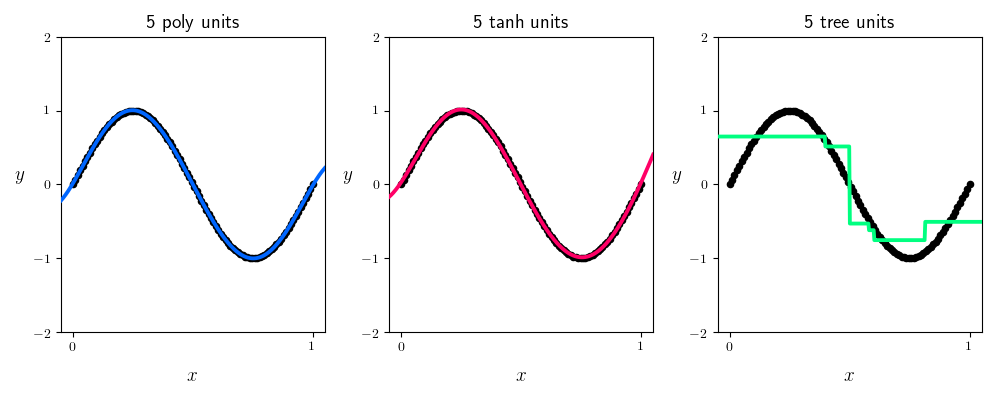
...
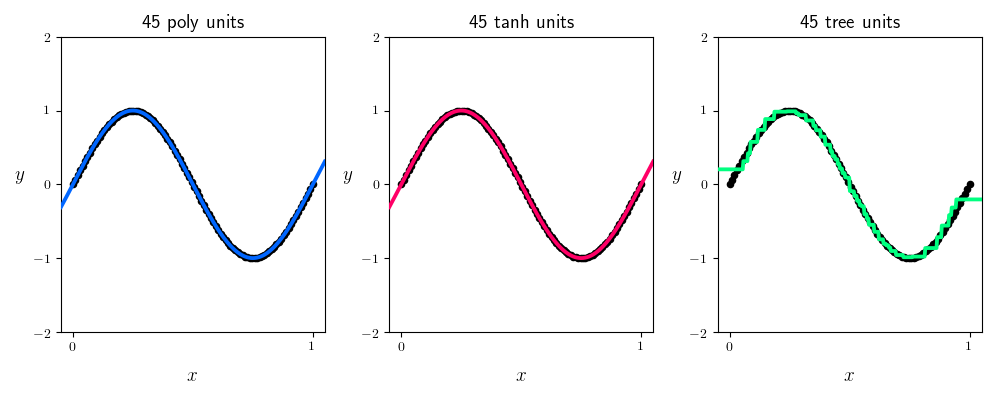
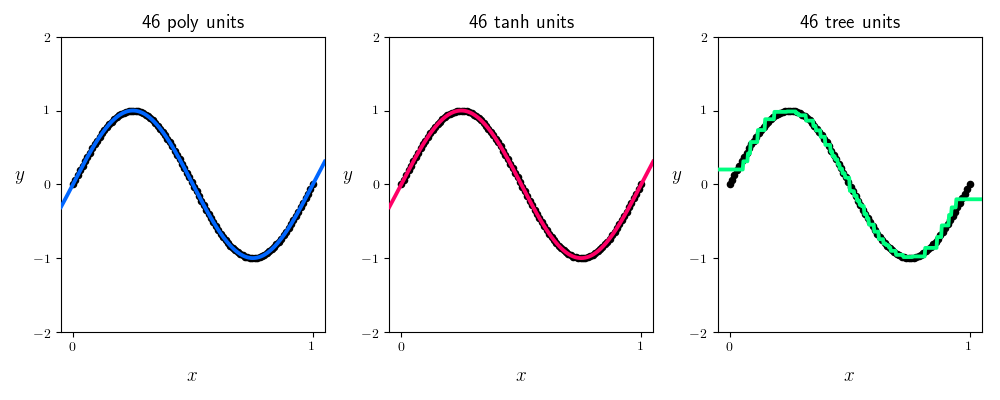
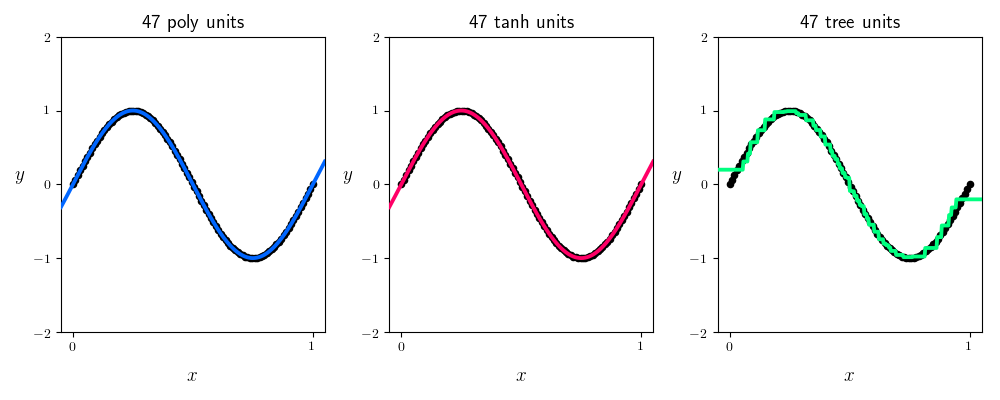
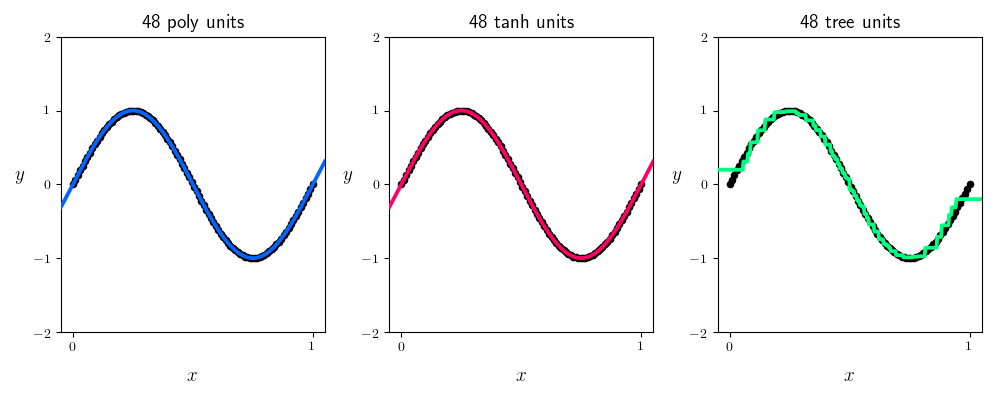
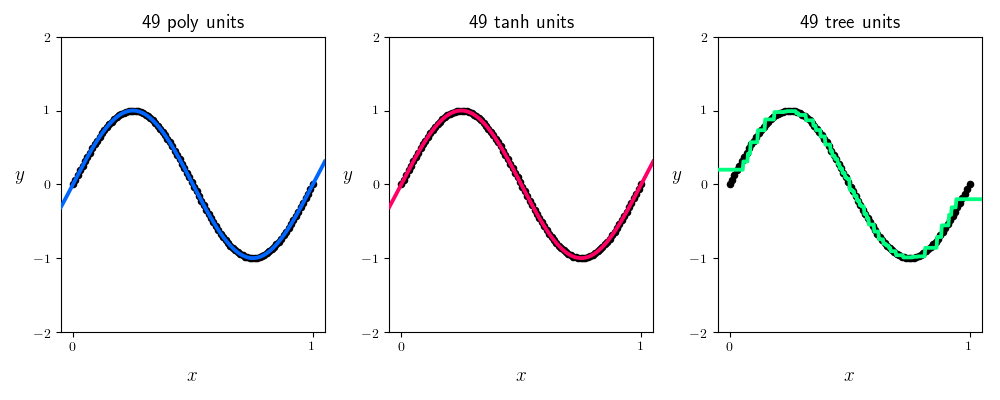

In [205]:
## This code cell will not be shown in the HTML version of this notebook
# produce visual comparison of different universal approximator fits
demo4 = nonlib.regression_basis_comparison_2d.Visualizer()
csvname = datapath + 'sin_function.csv'
demo4.load_data(csvname)
demo4.brows_fits(num_elements = [v for v in range(1,50,1)])

&copy; This material is not to be distributed, copied, or reused without written permission from the authors.